In [164]:
from utilities_ketamine_analysis_v8 import *

In [165]:
# whos

In [166]:
# pip install quantities

In [167]:
# pip install neo

In [168]:
# pip install ghostipy

In [169]:
# pip install mat73

In [170]:
# You may need to uncomment the following line if running this
# notebook on Colab

import ghostipy as gsp
import numpy as np
import scipy.signal as signal
import matplotlib.pyplot as plt
import matplotlib.ticker as plticker
import os
import h5py
import warnings
from urllib.request import urlopen
plt.rcParams['pdf.fonttype'] = 42

In [171]:
from scipy.signal import butter, lfilter, freqz, iirnotch, welch 

# Filenames to analyze

In [172]:
binPath = r'C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\electrophysiology\\'
binFullPath = Path(binPath)

In [173]:
#nt_Path for behavior
#sync_path for sync pulse
#ksort_path

dlc_path = binFullPath.parents[1]

files = dlc_path.glob('**/*.mat')

sync_path=[]
nt_path=[]

for i in sorted(files):
    
    if 'sync' in str(i): 
        print(i)
        sync_path.append(i)
        
    if 'behavior' in str(i): 
        print(i)
        nt_path.append(i)

print(nt_path[-1])

C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\behavior\2022-07-27_07-41-00_M015_SAL_PFC_HPC_0_0_0mpk.mat
C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\behavior\2022-07-28_13-19-00_M016_SAL_PFC_HPC_0_0_0mpk.mat
C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\behavior\2022-08-01_04-30-00_M015_RSK_mPFC_HPC_3_10_30mpk.mat
C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\behavior\2022-08-03_12-45-00_M015_RSK_mPFC_HPC_3_10_30mpk.mat
C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\behavior\2022-08-04_03-45-00_M016_RSK_mPFC_HPC_3_10_30mpk.mat
C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\behavior\2022-08-06-05-20-00_M016_RSK_mPFC_HPC_3_10_30mpk.mat
C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\behavior\2022-08-08-04-05-00_M017_SAL_mPFC_HPC_0_0_0mpk.mat
C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\behavior\2022-08-11-01-55-00_M018_SAL_mPFC_HPC_0_0_0mpk.mat
C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketam

In [103]:

#Example of how to append two files together
dlc_path = binFullPath
ksort_HPC_path=[]
ksort_PFC_path=[]

files = os.listdir(dlc_path)
for i in sorted(files):
            
    if 'HPCprobe' in str(i): 
        ksort_HPC_path.append(Path(r'C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\electrophysiology\\' + i))
        print(i)
#     if 'PFCprobe' in str(i): 
#         ksort_PFC_path.append(Path(r'G:\My Drive\Fenton_Lab\Ketamine_analysis\Ketamine_data\Neurotar_HPC_ketamine\SPK\electrophysiology\\' + i))      
#         print(i)
        
print(ksort_HPC_path)

2022-07-27_07-41-00_M015_SAL_PFC_HPC_0_0_0mpk_HPCprobe
2022-07-28_13-19-00_M016_SAL_PFC_HPC_0_0_0mpk_HPCprobe
2022-08-01_04-30-00_M015_RSK_mPFC_HPC_3_10_30mpk_HPCprobe
2022-08-03_12-45-00_M015_RSK_mPFC_HPC_3_10_30mpk_HPCprobe
2022-08-04_03-45-00_M016_RSK_mPFC_HPC_3_10_30mpk_HPCprobe
2022-08-06-05-20-00_M016_RSK_mPFC_HPC_3_10_30mpk_HPCprobe
2022-08-08-04-05-00_M017_SAL_mPFC_HPC_0_0_0mpk_HPCprobe
2022-08-11-01-55-00_M018_SAL_mPFC_HPC_0_0_0mpk_HPCprobe
2022-08-12-02-35-00_M017_RSK_mPFC_HPC_3_10_30mpk_HPCprobe
2022-08-13-03-57-00_M018_RSK_mPFC_HPC_3_10_30mpk_HPCprobe
2022-08-15-02-25-00_M018_RSK_mPFC_HPC_3_10_30mpk_HPCprobe
2022-08-18-01-20-00_M020_1020_mPFC_HPC_1_3_10_30mpk_HPCprobe
2022-08-19-04-25-00_M019_1020_mPFC_HPC_1_3_10_30mpk_HPCprobe
2022-09-06-01-50-00-M021_1020_mPFC_HPC_1_3_10_30mpk_HPCprobe
2022-09-07-02-54-00-M022_1020_mPFC_HPC_1_3_10_30mpk_HPCprobe
2022-09-12-04-40-00_M023_SAL_mPFC_HPC_0_0_0mpk_HPCprobe
2022-09-14-03-35-00_M023_RSK_mPFC_HPC_3_10_30mpk_HPCprobe
2022-09-16-02-

# Behavior

### Load neurotar

In [175]:
print(len(nt_path),len(sync_path),len(ksort_HPC_path))

36 36 36


In [176]:
import mat73
ts_ephys_aln = []
nt_sync_aln = []
camera_sync_aln = []
ioFS = []
x = []
y = []
yaw = []
speed = []
sync_bool = []

for ipath in range(0,len(nt_path)):
    
    ipathsync = sync_path[ipath]
    ipathnt = nt_path[ipath]

    print('experiment',ipathsync)
    
    # raw files for sync and behavior
    sync_extracted = mat73.loadmat(ipathsync)
    behavior = loadmat(ipathnt)
    
    if np.abs(sync_extracted['samplesSyncAP_HPCprobe'].size - sync_extracted['samplesCamera'].size) < 1000:
        
        ts_ephys_aln.append(sync_extracted['samplesSyncAP_HPCprobe'])
        nt_sync_aln.append(sync_extracted['samplesNeurotarStrobe'])
        camera_sync_aln.append(sync_extracted['samplesCamera'])
        ioFS.append(sync_extracted['ioFS'])
        
        x.append(behavior['nt_x'][0])
        y.append(behavior['nt_y'][0])
        yaw.append(behavior['nt_alpha'][0])
        speed.append(behavior['nt_speed'][0])
        
        
        sync_bool.append(True)
        
    else:
        sync_bool.append(False)


#     if 'SAL' in ipathsync:

experiment C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\sync\2022-07-27_07-41-00_M015_SAL_PFC_HPC_0_0_0mpk.mat
experiment C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\sync\2022-07-28_13-19-00_M016_SAL_PFC_HPC_0_0_0mpk.mat
experiment C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\sync\2022-08-01_04-30-00_M015_RSK_mPFC_HPC_3_10_30mpk.mat
experiment C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\sync\2022-08-03_12-45-00_M015_RSK_mPFC_HPC_3_10_30mpk.mat
experiment C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\sync\2022-08-04_03-45-00_M016_RSK_mPFC_HPC_3_10_30mpk.mat
experiment C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\sync\2022-08-06-05-20-00_M016_RSK_mPFC_HPC_3_10_30mpk.mat
experiment C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\sync\2022-08-08-04-05-00_M017_SAL_mPFC_HPC_0_0_0mpk.mat
experiment C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\sync\2022-08-11-01-55-00_M018_SAL_mPFC_HPC_0_0_0mp

In [178]:
ipath

35

In [179]:
print(sync_bool)
sync_cond = (np.hstack(sync_bool))
print(sync_cond)

[True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True]
[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True]


In [180]:
idx_sync_ok = np.flatnonzero(sync_cond == True)
idx_sync_ok.shape

(36,)

In [181]:
#Already alligned
sync_path_matched = np.array(sync_path)[idx_sync_ok]
nt_path_matched = np.array(nt_path)[idx_sync_ok]
ksort_HPC_path_matched = np.array(ksort_HPC_path)[idx_sync_ok]
# ksort_PFC_path_matched = np.array(ksort_PFC_path)[idx_sync_ok]

In [182]:
print(ksort_HPC_path_matched)

out_path = Path(r'C:\Users\fentonlab\Desktop\Gino\HPC_channel_info\\')

sync_PATH = os.path.join(out_path,'sync_path_matched.pkl')
nt_PATH = os.path.join(out_path,'nt_path_matched.pkl')
ksort_PATH = os.path.join(out_path,'ksort_HPC_path_matched.pkl')

with open(sync_PATH,'wb') as file:
    pickle.dump(sync_path_matched, file)
    
with open(nt_PATH,'wb') as file:
    pickle.dump(nt_path_matched, file)
    
with open(ksort_PATH,'wb') as file:
    pickle.dump(ksort_HPC_path_matched, file)

[WindowsPath('C:/Users/fentonlab/Desktop/Tony/Neurotar_HPC_ketamine/SPK/electrophysiology/2022-07-27_07-41-00_M015_SAL_PFC_HPC_0_0_0mpk_HPCprobe')
 WindowsPath('C:/Users/fentonlab/Desktop/Tony/Neurotar_HPC_ketamine/SPK/electrophysiology/2022-07-28_13-19-00_M016_SAL_PFC_HPC_0_0_0mpk_HPCprobe')
 WindowsPath('C:/Users/fentonlab/Desktop/Tony/Neurotar_HPC_ketamine/SPK/electrophysiology/2022-08-01_04-30-00_M015_RSK_mPFC_HPC_3_10_30mpk_HPCprobe')
 WindowsPath('C:/Users/fentonlab/Desktop/Tony/Neurotar_HPC_ketamine/SPK/electrophysiology/2022-08-03_12-45-00_M015_RSK_mPFC_HPC_3_10_30mpk_HPCprobe')
 WindowsPath('C:/Users/fentonlab/Desktop/Tony/Neurotar_HPC_ketamine/SPK/electrophysiology/2022-08-04_03-45-00_M016_RSK_mPFC_HPC_3_10_30mpk_HPCprobe')
 WindowsPath('C:/Users/fentonlab/Desktop/Tony/Neurotar_HPC_ketamine/SPK/electrophysiology/2022-08-06-05-20-00_M016_RSK_mPFC_HPC_3_10_30mpk_HPCprobe')
 WindowsPath('C:/Users/fentonlab/Desktop/Tony/Neurotar_HPC_ketamine/SPK/electrophysiology/2022-08-08-04-05

In [184]:
# %whos ndarray & list & DataFrame

experiment C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\sync\2022-07-27_07-41-00_M015_SAL_PFC_HPC_0_0_0mpk.mat


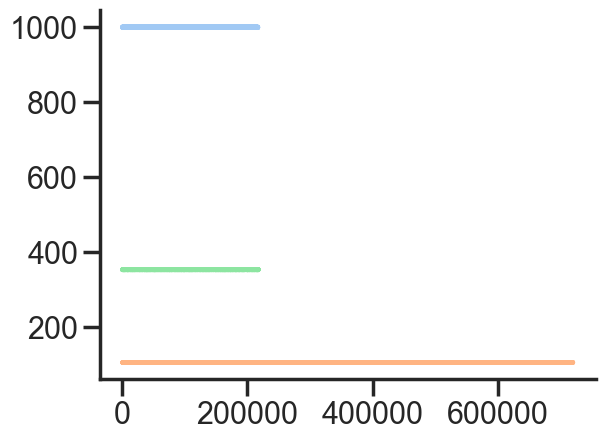

[3.0000000e+02 6.5300000e+02 1.0060000e+03 ... 7.6862194e+07 7.6862546e+07
 7.6862899e+07]
[  101676.   101782.   101888. ... 76393290. 76393396. 76393502.]
camera [288] [216384]
[216096]
217115 720220 217715
nt [3] [720217]
[7202.000933333334] [7201.89834239 7201.89834239 7201.89834239 7201.89834239 7201.89834239
 7201.89834239 7201.89834239 7201.89834239 7201.89834239 7201.89834239
 7201.89834239 7201.89834239 7201.89834239 7201.89834239 7201.89834239
 7201.89834239 7201.89834239 7201.89834239 7201.89834239 7201.89834239
 7201.89834239 7201.89834239 7201.89834239 7201.89834239 7201.89834239
 7201.89834239 7201.89834239 7201.89834239 7201.89834239 7201.89834239
 7201.89834239 7201.89834239 7201.89834239 7201.89834239 7201.89834239
 7201.89834239]
Deviation of [102.59094486] in miliseconds
Deviation at start [-1.0384] in miliseconds
Deviation at end [7.1744] in miliseconds
experiment C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\sync\2022-07-28_13-19-00_M016_SAL_PFC_HPC_0_0

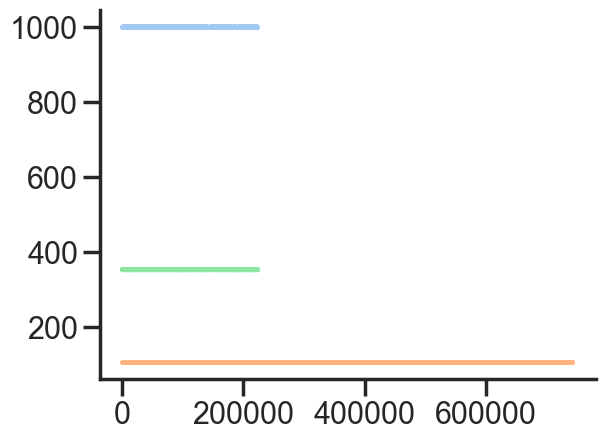

[2.7900000e+02 6.3100000e+02 9.8400000e+02 ... 7.9087070e+07 7.9087423e+07
 7.9087777e+07]
[  237589.   237695.   237801. ... 78991297. 78991403. 78991509.]
camera [673] [223415]
[222742]
223416 743463 224016
nt [3] [742370]
[7202.000933333334, 7423.529366666667] [7423.42030879 7423.42030879 7423.42030879 7423.42030879 7423.42030879
 7423.42030879 7423.42030879 7423.42030879 7423.42030879 7423.42030879
 7423.42030879 7423.42030879 7423.42030879 7423.42030879 7423.42030879
 7423.42030879 7423.42030879 7423.42030879 7423.42030879 7423.42030879
 7423.42030879 7423.42030879 7423.42030879 7423.42030879 7423.42030879
 7423.42030879 7423.42030879 7423.42030879 7423.42030879 7423.42030879
 7423.42030879 7423.42030879 7423.42030879 7423.42030879 7423.42030879
 7423.42030879]
Deviation of [109.05787854] in miliseconds
Deviation at start [-1.416] in miliseconds
Deviation at end [8.6848] in miliseconds
experiment C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\sync\2022-08-01_04-30-00_M0

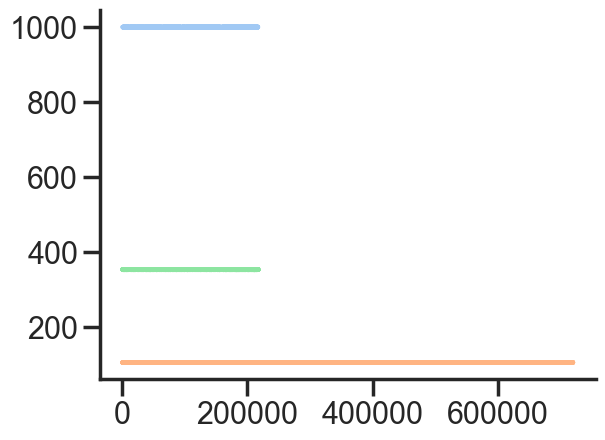

[  134206.   134560.   134913. ... 77070277. 77070630. 77070983.]
[  370933.   371039.   371145. ... 76664109. 76664215. 76664321.]
camera [671] [216743]
[216072]
217296 720235 217896
nt [2] [720232]
[7202.000933333334, 7423.529366666667, 7202.1657] [7202.05580159 7202.05580159 7202.05580159 7202.05580159 7202.05580159
 7202.05580159 7202.05580159 7202.05580159 7202.05580159 7202.05580159
 7202.05580159 7202.05580159 7202.05580159 7202.05580159 7202.05580159
 7202.05580159 7202.05580159 7202.05580159 7202.05580159 7202.05580159
 7202.05580159 7202.05580159 7202.05580159 7202.05580159 7202.05580159
 7202.05580159 7202.05580159 7202.05580159 7202.05580159 7202.05580159
 7202.05580159 7202.05580159 7202.05580159 7202.05580159 7202.05580159
 7202.05580159]
Deviation of [109.89841152] in miliseconds
Deviation at start [-0.6608] in miliseconds
Deviation at end [9.44] in miliseconds
experiment C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\sync\2022-08-03_12-45-00_M015_RSK_mPFC_HPC

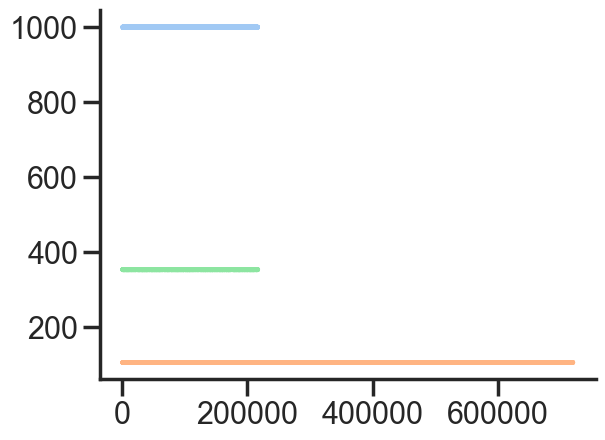

[4.8546000e+04 4.8899000e+04 4.9252000e+04 ... 7.6621546e+07 7.6621899e+07
 7.6622252e+07]
[  264092.   264198.   264304. ... 76542276. 76542382. 76542488.]
camera [611] [216675]
[216064]
216902 720095 216902
nt [2] [720093]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666] [7200.65056319 7200.65056319 7200.65056319 7200.65056319 7200.65056319
 7200.65056319 7200.65056319 7200.65056319 7200.65056319 7200.65056319
 7200.65056319 7200.65056319 7200.65056319 7200.65056319 7200.65056319
 7200.65056319 7200.65056319 7200.65056319 7200.65056319 7200.65056319
 7200.65056319 7200.65056319 7200.65056319 7200.65056319 7200.65056319
 7200.65056319 7200.65056319 7200.65056319 7200.65056319 7200.65056319
 7200.65056319 7200.65056319 7200.65056319 7200.65056319 7200.65056319
 7200.65056319]
Deviation of [121.00347819] in miliseconds
Deviation at start [-2.2656] in miliseconds
Deviation at end [6.5136] in miliseconds
experiment C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\

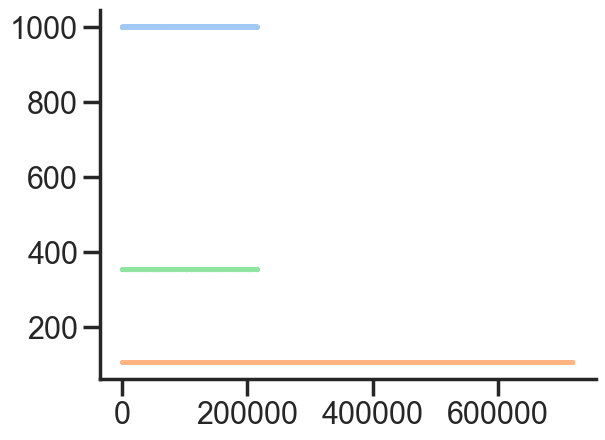

[  146910.   147263.   147615. ... 76618898. 76619251. 76619604.]
[  247968.   248074.   248180. ... 76560257. 76560363. 76560469.]
camera [287] [216414]
[216127]
216583 720417 216583
nt [3] [720414]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667] [7203.85006239 7203.85006239 7203.85006239 7203.85006239 7203.85006239
 7203.85006239 7203.85006239 7203.85006239 7203.85006239 7203.85006239
 7203.85006239 7203.85006239 7203.85006239 7203.85006239 7203.85006239
 7203.85006239 7203.85006239 7203.85006239 7203.85006239 7203.85006239
 7203.85006239 7203.85006239 7203.85006239 7203.85006239 7203.85006239
 7203.85006239 7203.85006239 7203.85006239 7203.85006239 7203.85006239
 7203.85006239 7203.85006239 7203.85006239 7203.85006239 7203.85006239
 7203.85006239]
Deviation of [127.20427819] in miliseconds
Deviation at start [-4.72] in miliseconds
Deviation at end [2.4544] in miliseconds
experiment C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\sync

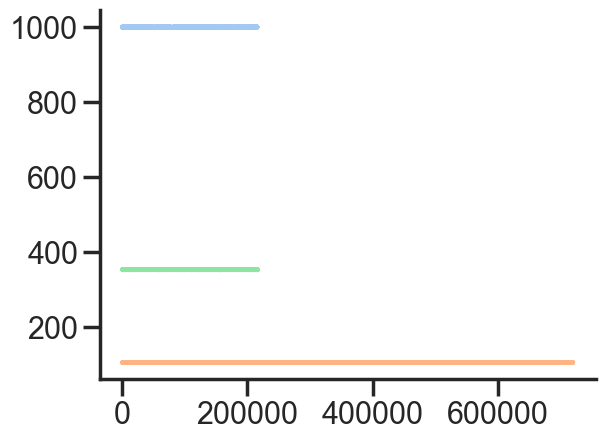

[   85608.    85961.    86314. ... 76499529. 76499882. 76500235.]
[  155888.   155994.   156100. ... 76451228. 76451334. 76451440.]
camera [200] [215985]
[215785]
215986 720257 216417
nt [4] [719280]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334] [7192.50044479 7192.50044479 7192.50044479 7192.50044479 7192.50044479
 7192.50044479 7192.50044479 7192.50044479 7192.50044479 7192.50044479
 7192.50044479 7192.50044479 7192.50044479 7192.50044479 7192.50044479
 7192.50044479 7192.50044479 7192.50044479 7192.50044479 7192.50044479
 7192.50044479 7192.50044479 7192.50044479 7192.50044479 7192.50044479
 7192.50044479 7192.50044479 7192.50044479 7192.50044479 7192.50044479
 7192.50044479 7192.50044479 7192.50044479 7192.50044479 7192.50044479
 7192.50044479]
Deviation of [125.48854484] in miliseconds
Deviation at start [-7.9296] in miliseconds
Deviation at end [1.5104] in miliseconds
experiment C:\Users\fentonlab\Desktop\Tony\Neurotar_

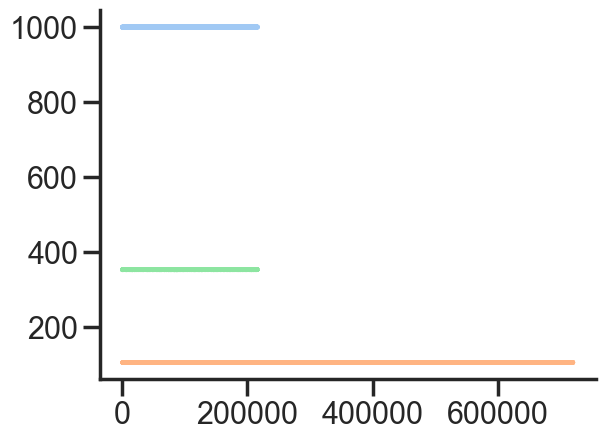

[   91209.    91562.    91915. ... 76512166. 76512519. 76512872.]
[  163006.   163112.   163218. ... 76467023. 76467129. 76467235.]
camera [204] [216306]
[216102]
216437 720339 216437
nt [3] [720335]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667] [7203.05917919 7203.05917919 7203.05917919 7203.05917919 7203.05917919
 7203.05917919 7203.05917919 7203.05917919 7203.05917919 7203.05917919
 7203.05917919 7203.05917919 7203.05917919 7203.05917919 7203.05917919
 7203.05917919 7203.05917919 7203.05917919 7203.05917919 7203.05917919
 7203.05917919 7203.05917919 7203.05917919 7203.05917919 7203.05917919
 7203.05917919 7203.05917919 7203.05917919 7203.05917919 7203.05917919
 7203.05917919 7203.05917919 7203.05917919 7203.05917919 7203.05917919
 7203.05917919]
Deviation of [151.58747819] in miliseconds
Deviation at start [-9.6288] in miliseconds
Deviation at end [4.9088] in miliseconds
experiment C:\Users\fentonlab\Des

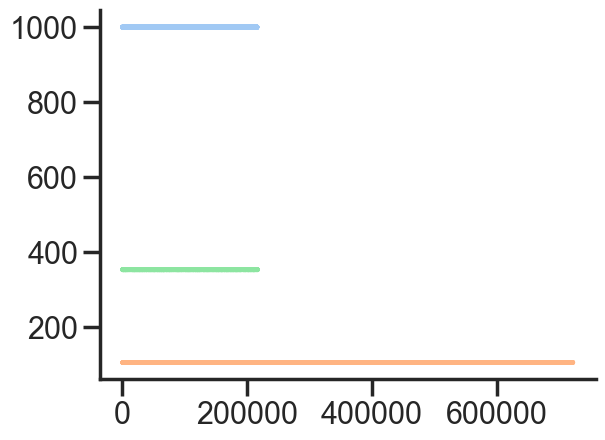

[  107373.   107726.   108079. ... 76682624. 76682977. 76683330.]
[  162701.   162806.   162912. ... 76632494. 76632600. 76632706.]
camera [157] [216453]
[216296]
216454 721904 216903
nt [2] [720884]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666] [7208.55892319 7208.55892319 7208.55892319 7208.55892319 7208.55892319
 7208.55892319 7208.55892319 7208.55892319 7208.55892319 7208.55892319
 7208.55892319 7208.55892319 7208.55892319 7208.55892319 7208.55892319
 7208.55892319 7208.55892319 7208.55892319 7208.55892319 7208.55892319
 7208.55892319 7208.55892319 7208.55892319 7208.55892319 7208.55892319
 7208.55892319 7208.55892319 7208.55892319 7208.55892319 7208.55892319
 7208.55892319 7208.55892319 7208.55892319 7208.55892319 7208.55892319
 7208.55892319]
Deviation of [148.7434782] in miliseconds
Deviation at start [-9.6288] in miliseconds
Deviation at end [4.0592] in miliseconds
experiment C:\U

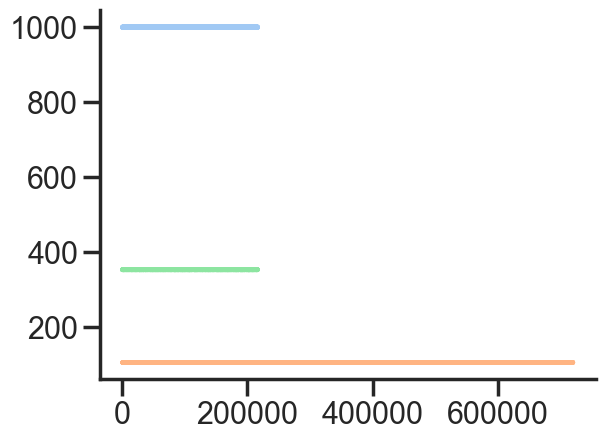

[5.4456000e+04 5.4809000e+04 5.5162000e+04 ... 7.6489010e+07 7.6489363e+07
 7.6489715e+07]
[  121828.   121934.   122040. ... 76437077. 76437183. 76437289.]
camera [191] [216355]
[216164]
216505 720445 216505
nt [1] [720442]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335] [7204.14949919 7204.14949919 7204.14949919 7204.14949919 7204.14949919
 7204.14949919 7204.14949919 7204.14949919 7204.14949919 7204.14949919
 7204.14949919 7204.14949919 7204.14949919 7204.14949919 7204.14949919
 7204.14949919 7204.14949919 7204.14949919 7204.14949919 7204.14949919
 7204.14949919 7204.14949919 7204.14949919 7204.14949919 7204.14949919
 7204.14949919 7204.14949919 7204.14949919 7204.14949919 7204.14949919
 7204.14949919 7204.14949919 7204.14949919 7204.14949919 7204.14949919
 7204.14949919]
Deviation of [141.33414486] in miliseconds
Deviation at start [-4.4368] in miliseconds
Deviation 

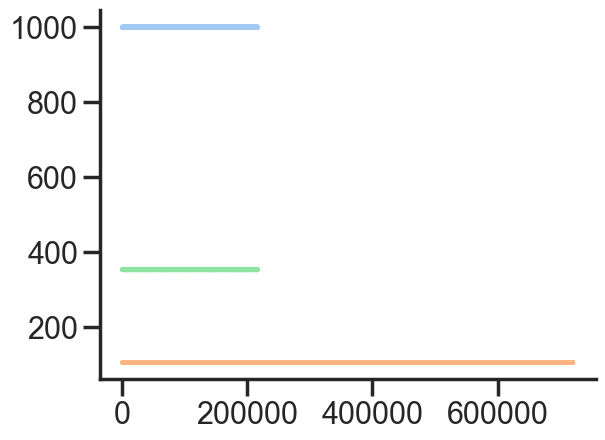

[5.7176000e+04 5.7528000e+04 5.7881000e+04 ... 7.6545630e+07 7.6545983e+07
 7.6546336e+07]
[   99455.    99561.    99667. ... 76451570. 76451676. 76451782.]
camera [120] [216297]
[216177]
216298 720793 216659
nt [1] [720481]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833] [7204.53974879 7204.53974879 7204.53974879 7204.53974879 7204.53974879
 7204.53974879 7204.53974879 7204.53974879 7204.53974879 7204.53974879
 7204.53974879 7204.53974879 7204.53974879 7204.53974879 7204.53974879
 7204.53974879 7204.53974879 7204.53974879 7204.53974879 7204.53974879
 7204.53974879 7204.53974879 7204.53974879 7204.53974879 7204.53974879
 7204.53974879 7204.53974879 7204.53974879 7204.53974879 7204.53974879
 7204.53974879 7204.53974879 7204.53974879 7204.53974879 7204.53974879
 7204.53974879]
Deviation of [143.55121153] in miliseconds
Deviation at start [-2.6432] in miliseconds

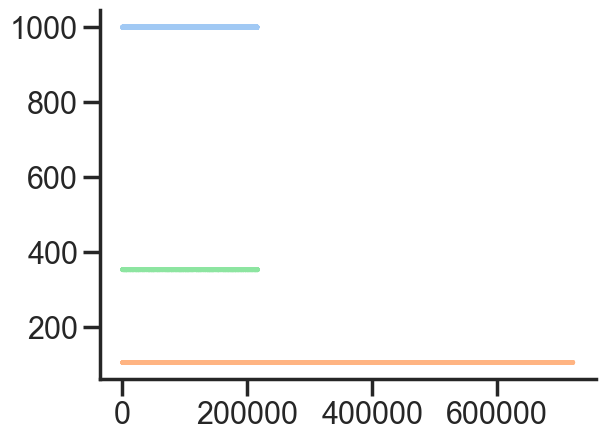

[   80071.    80424.    80777. ... 76604019. 76604372. 76604725.]
[  131974.   132079.   132185. ... 76545204. 76545310. 76545416.]
camera [147] [216310]
[216163]
216311 721370 216758
nt [1] [720439]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666] [7204.11929119 7204.11929119 7204.11929119 7204.11929119 7204.11929119
 7204.11929119 7204.11929119 7204.11929119 7204.11929119 7204.11929119
 7204.11929119 7204.11929119 7204.11929119 7204.11929119 7204.11929119
 7204.11929119 7204.11929119 7204.11929119 7204.11929119 7204.11929119
 7204.11929119 7204.11929119 7204.11929119 7204.11929119 7204.11929119
 7204.11929119 7204.11929119 7204.11929119 7204.11929119 7204.11929119
 7204.11929119 7204.11929119 7204.11929119 7204.11929119 7204.11929119
 7204.11929119]
Deviation of [150.07547819] in miliseconds
Deviation at start [-9.6288] in miliseconds
Devia

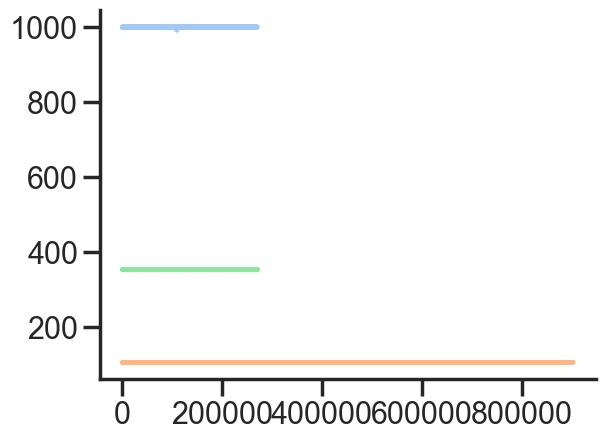

[8.5149000e+04 8.5502000e+04 8.5855000e+04 ... 9.5736157e+07 9.5736510e+07
 9.5736863e+07]
[  145744.   145850.   145956. ... 95777671. 95777777. 95777883.]
camera [172] [270553]
[270381]
270554 902801 270902
nt [2] [901252]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333] [9012.17438559 9012.17438559 9012.17438559 9012.17438559 9012.17438559
 9012.17438559 9012.17438559 9012.17438559 9012.17438559 9012.17438559
 9012.17438559 9012.17438559 9012.17438559 9012.17438559 9012.17438559
 9012.17438559 9012.17438559 9012.17438559 9012.17438559 9012.17438559
 9012.17438559 9012.17438559 9012.17438559 9012.17438559 9012.17438559
 9012.17438559 9012.17438559 9012.17438559 9012.17438559 9012.17438559
 9012.17438559 9012.17438559 9012.17438559 9012.17438559 9012.17438559
 9012.17438559]
Deviation of [184.34774775] in miliseconds
Devia

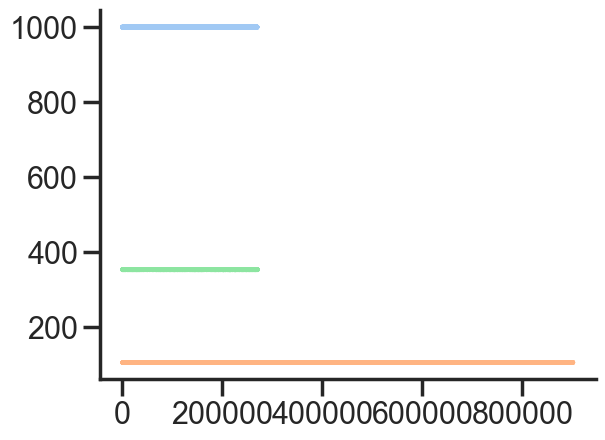

[4.5664000e+04 4.6017000e+04 4.6370000e+04 ... 9.5640397e+07 9.5640750e+07
 9.5641102e+07]
[  100057.   100162.   100268. ... 95591298. 95591404. 95591510.]
camera [155] [270264]
[270109]
270265 901473 270743
nt [4] [900346]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667] [9003.09357759 9003.09357759 9003.09357759 9003.09357759 9003.09357759
 9003.09357759 9003.09357759 9003.09357759 9003.09357759 9003.09357759
 9003.09357759 9003.09357759 9003.09357759 9003.09357759 9003.09357759
 9003.09357759 9003.09357759 9003.09357759 9003.09357759 9003.09357759
 9003.09357759 9003.09357759 9003.09357759 9003.09357759 9003.09357759
 9003.09357759 9003.09357759 9003.09357759 9003.09357759 9003.09357759
 9003.09357759 9003.09357759 9003.09357759 9003.09357759 9003.09357759
 9003.09357759]
Deviation of [187.98908107] i

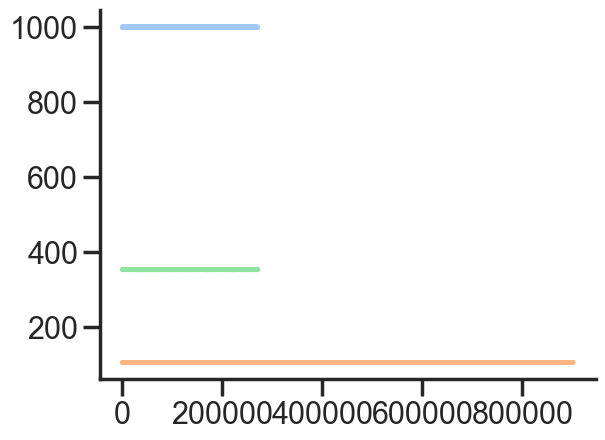

[5.7658000e+04 5.8011000e+04 5.8364000e+04 ... 9.5690911e+07 9.5691264e+07
 9.5691617e+07]
[  126263.   126369.   126475. ... 95604982. 95605088. 95605194.]
camera [195] [270607]
[270412]
270853 901355 270853
nt [3] [901353]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667] [9013.17106079 9013.17106079 9013.17106079 9013.17106079 9013.17106079
 9013.17106079 9013.17106079 9013.17106079 9013.17106079 9013.17106079
 9013.17106079 9013.17106079 9013.17106079 9013.17106079 9013.17106079
 9013.17106079 9013.17106079 9013.17106079 9013.17106079 9013.17106079
 9013.17106079 9013.17106079 9013.17106079 9013.17106079 9013.17106079
 9013.17106079 9013.17106079 9013.17106079 9013.17106079 9013.17106079
 9013.17106079 9013.17106079 9013.17106079 9013.17106079 9013.17106079
 9013.17106079]
Deviation 

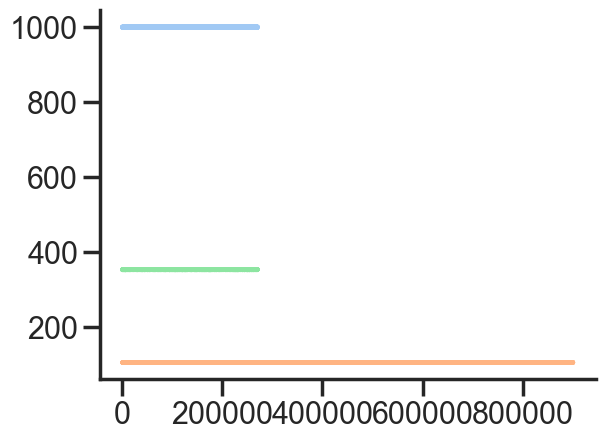

[7.3789000e+04 7.4142000e+04 7.4495000e+04 ... 9.5639546e+07 9.5639899e+07
 9.5640252e+07]
[  136214.   136320.   136426. ... 95567581. 95567687. 95567793.]
camera [177] [270457]
[270280]
270664 900908 270664
nt [1] [900904]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667, 9008.886066666666] [9008.70103199 9008.70103199 9008.70103199 9008.70103199 9008.70103199
 9008.70103199 9008.70103199 9008.70103199 9008.70103199 9008.70103199
 9008.70103199 9008.70103199 9008.70103199 9008.70103199 9008.70103199
 9008.70103199 9008.70103199 9008.70103199 9008.70103199 9008.70103199
 9008.70103199 9008.70103199 9008.70103199 9008.70103199 9008.70103199
 9008.70103199 9008.70103199 9008.70103199 9008.70103199 9008.70103199
 9008.70103199 9008.70103199 9008.70103199 9008.70103199 9008.70103199
 9008.7

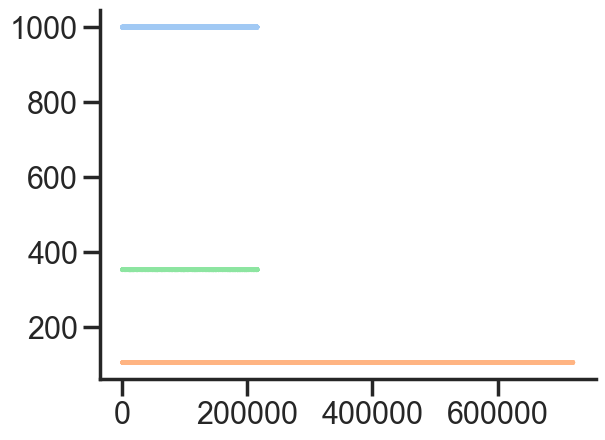

[  117557.   117910.   118263. ... 76526731. 76527084. 76527437.]
[  158043.   158149.   158255. ... 76492415. 76492521. 76492627.]
camera [115] [216205]
[216090]
216206 720626 216409
nt [2] [720276]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667, 9008.886066666666, 7202.6313666666665] [7202.47484319 7202.47484319 7202.47484319 7202.47484319 7202.47484319
 7202.47484319 7202.47484319 7202.47484319 7202.47484319 7202.47484319
 7202.47484319 7202.47484319 7202.47484319 7202.47484319 7202.47484319
 7202.47484319 7202.47484319 7202.47484319 7202.47484319 7202.47484319
 7202.47484319 7202.47484319 7202.47484319 7202.47484319 7202.47484319
 7202.47484319 7202.47484319 7202.47484319 7202.47484319 7202.47484319
 7202.47484319 7202.47484319 7202.47484319 7202.47484319 7202.47484319
 7202.474843

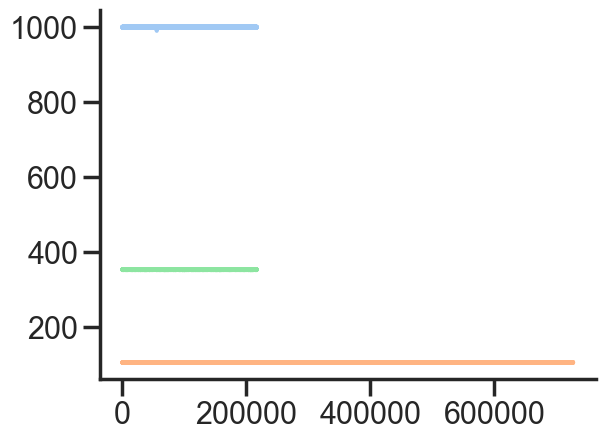

[6.2515000e+04 6.2868000e+04 6.3221000e+04 ... 7.6646117e+07 7.6646470e+07
 7.6646823e+07]
[  112970.   113076.   113182. ... 77105577. 77105683. 77105789.]
camera [143] [216901]
[216758]
216902 726840 216902
nt [1] [722506]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667, 9008.886066666666, 7202.6313666666665, 7224.9296] [7224.78363999 7224.78363999 7224.78363999 7224.78363999 7224.78363999
 7224.78363999 7224.78363999 7224.78363999 7224.78363999 7224.78363999
 7224.78363999 7224.78363999 7224.78363999 7224.78363999 7224.78363999
 7224.78363999 7224.78363999 7224.78363999 7224.78363999 7224.78363999
 7224.78363999 7224.78363999 7224.78363999 7224.78363999 7224.78363999
 7224.78363999 7224.78363999 7224.78363999 7224.78363999 7224.78363999
 7224.78363999 7224.78363999 7224.78363999 7224

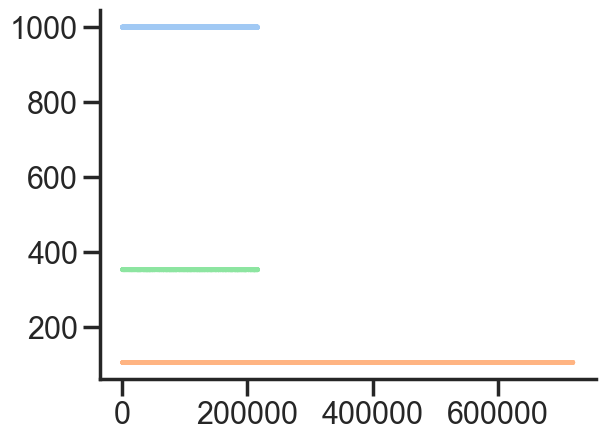

[5.3592000e+04 5.3945000e+04 5.4298000e+04 ... 7.6536107e+07 7.6536460e+07
 7.6536813e+07]
[  111262.   111368.   111474. ... 76401774. 76401880. 76401986.]
camera [164] [216250]
[216086]
216251 720212 216639
nt [3] [720190]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667, 9008.886066666666, 7202.6313666666665, 7224.9296, 7201.7563666666665] [7201.60428639 7201.60428639 7201.60428639 7201.60428639 7201.60428639
 7201.60428639 7201.60428639 7201.60428639 7201.60428639 7201.60428639
 7201.60428639 7201.60428639 7201.60428639 7201.60428639 7201.60428639
 7201.60428639 7201.60428639 7201.60428639 7201.60428639 7201.60428639
 7201.60428639 7201.60428639 7201.60428639 7201.60428639 7201.60428639
 7201.60428639 7201.60428639 7201.60428639 7201.60428639 7201.60428639
 7201.60428639 7201.6042863

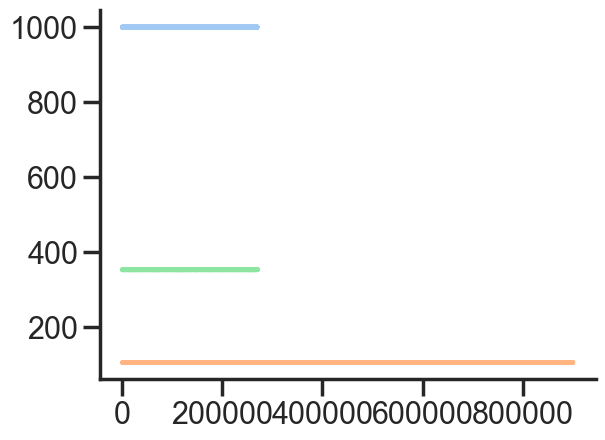

[3.2351000e+04 3.2705000e+04 3.3058000e+04 ... 9.5535001e+07 9.5535354e+07
 9.5535707e+07]
[8.8819000e+04 8.8925000e+04 8.9031000e+04 ... 9.5490906e+07 9.5491012e+07
 9.5491117e+07]
camera [160] [270040]
[269880]
270041 900631 270514
nt [1] [899474]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667, 9008.886066666666, 7202.6313666666665, 7224.9296, 7201.7563666666665, 8994.584966666667] [8994.40736159 8994.40736159 8994.40736159 8994.40736159 8994.40736159
 8994.40736159 8994.40736159 8994.40736159 8994.40736159 8994.40736159
 8994.40736159 8994.40736159 8994.40736159 8994.40736159 8994.40736159
 8994.40736159 8994.40736159 8994.40736159 8994.40736159 8994.40736159
 8994.40736159 8994.40736159 8994.40736159 8994.40736159 8994.40736159
 8994.40736159 8994.40736159 8994.40736159 8994.407361

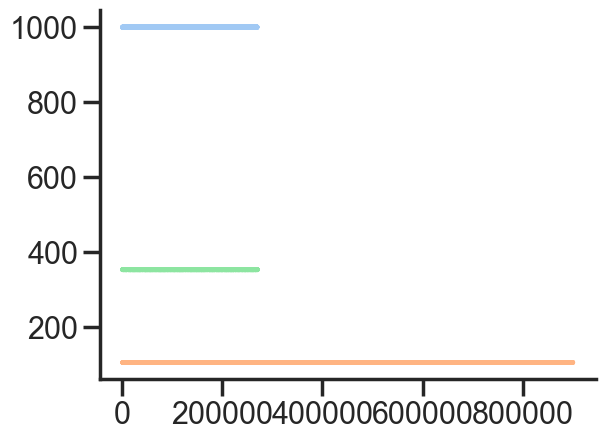

[4.2056000e+04 4.2409000e+04 4.2762000e+04 ... 9.5570325e+07 9.5570678e+07
 9.5571031e+07]
[9.2498000e+04 9.2604000e+04 9.2710000e+04 ... 9.5519040e+07 9.5519146e+07
 9.5519252e+07]
camera [143] [270150]
[270007]
270151 900862 270587
nt [1] [899896]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667, 9008.886066666666, 7202.6313666666665, 7224.9296, 7201.7563666666665, 8994.584966666667, 8998.803033333334] [8998.62590879 8998.62590879 8998.62590879 8998.62590879 8998.62590879
 8998.62590879 8998.62590879 8998.62590879 8998.62590879 8998.62590879
 8998.62590879 8998.62590879 8998.62590879 8998.62590879 8998.62590879
 8998.62590879 8998.62590879 8998.62590879 8998.62590879 8998.62590879
 8998.62590879 8998.62590879 8998.62590879 8998.62590879 8998.62590879
 8998.62590879 8998.62590879 8998.6

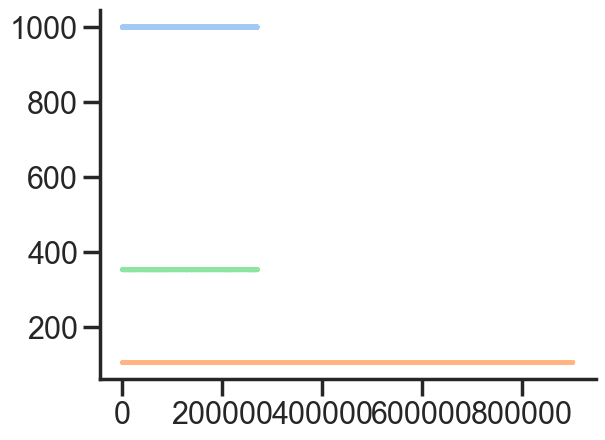

[4.0074000e+04 4.0427000e+04 4.0781000e+04 ... 9.5663789e+07 9.5664142e+07
 9.5664495e+07]
[   96729.    96835.    96941. ... 95635980. 95636086. 95636192.]
camera [161] [270581]
[270420]
270582 901926 270855
nt [2] [901282]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667, 9008.886066666666, 7202.6313666666665, 7224.9296, 7201.7563666666665, 8994.584966666667, 8998.803033333334, 9012.648933333334] [9012.47552159 9012.47552159 9012.47552159 9012.47552159 9012.47552159
 9012.47552159 9012.47552159 9012.47552159 9012.47552159 9012.47552159
 9012.47552159 9012.47552159 9012.47552159 9012.47552159 9012.47552159
 9012.47552159 9012.47552159 9012.47552159 9012.47552159 9012.47552159
 9012.47552159 9012.47552159 9012.47552159 9012.47552159 9012.47552159
 9012.47552159 9012.47552159 9012.4755215

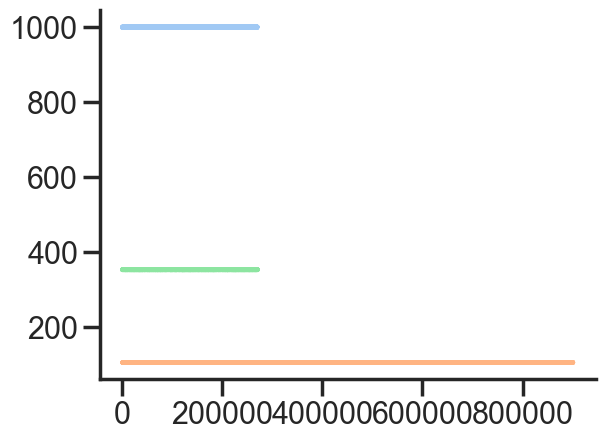

[3.8943000e+04 3.9295000e+04 3.9648000e+04 ... 9.5597267e+07 9.5597620e+07
 9.5597973e+07]
[8.2401000e+04 8.2507000e+04 8.2613000e+04 ... 9.5523037e+07 9.5523143e+07
 9.5523249e+07]
camera [124] [270225]
[270101]
270226 900995 270670
nt [3] [900219]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667, 9008.886066666666, 7202.6313666666665, 7224.9296, 7201.7563666666665, 8994.584966666667, 8998.803033333334, 9012.648933333334, 9002.0079] [9001.83635839 9001.83635839 9001.83635839 9001.83635839 9001.83635839
 9001.83635839 9001.83635839 9001.83635839 9001.83635839 9001.83635839
 9001.83635839 9001.83635839 9001.83635839 9001.83635839 9001.83635839
 9001.83635839 9001.83635839 9001.83635839 9001.83635839 9001.83635839
 9001.83635839 9001.83635839 9001.83635839 9001.83635839 9001.83635839
 9001

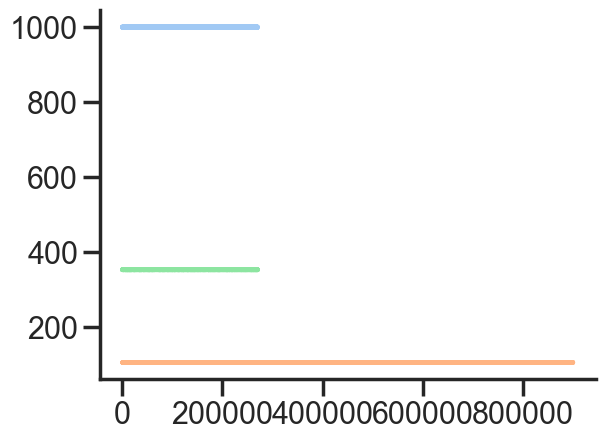

[3.8054000e+04 3.8407000e+04 3.8760000e+04 ... 9.5561144e+07 9.5561497e+07
 9.5561850e+07]
[8.2218000e+04 8.2324000e+04 8.2430000e+04 ... 9.5459079e+07 9.5459185e+07
 9.5459291e+07]
camera [126] [270280]
[270154]
270326 900393 270572
nt [3] [900390]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667, 9008.886066666666, 7202.6313666666665, 7224.9296, 7201.7563666666665, 8994.584966666667, 8998.803033333334, 9012.648933333334, 9002.0079, 9003.714433333333] [9003.54565919 9003.54565919 9003.54565919 9003.54565919 9003.54565919
 9003.54565919 9003.54565919 9003.54565919 9003.54565919 9003.54565919
 9003.54565919 9003.54565919 9003.54565919 9003.54565919 9003.54565919
 9003.54565919 9003.54565919 9003.54565919 9003.54565919 9003.54565919
 9003.54565919 9003.54565919 9003.54565919 9003.54565919 

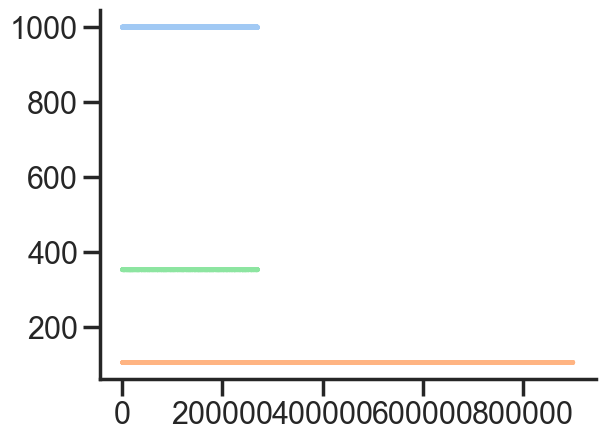

[9.0523000e+04 9.0876000e+04 9.1229000e+04 ... 9.5567054e+07 9.5567406e+07
 9.5567759e+07]
[  144563.   144669.   144775. ... 95518443. 95518549. 95518655.]
camera [154] [270296]
[270142]
270437 900365 270437
nt [4] [900360]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667, 9008.886066666666, 7202.6313666666665, 7224.9296, 7201.7563666666665, 8994.584966666667, 8998.803033333334, 9012.648933333334, 9002.0079, 9003.714433333333, 9003.420133333333] [9003.23423359 9003.23423359 9003.23423359 9003.23423359 9003.23423359
 9003.23423359 9003.23423359 9003.23423359 9003.23423359 9003.23423359
 9003.23423359 9003.23423359 9003.23423359 9003.23423359 9003.23423359
 9003.23423359 9003.23423359 9003.23423359 9003.23423359 9003.23423359
 9003.23423359 9003.23423359 9003.23423359 9003.23423359 9003.2

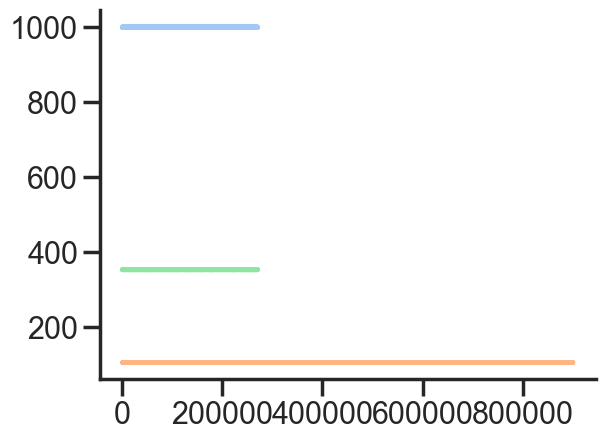

[9.0399000e+04 9.0751000e+04 9.1104000e+04 ... 9.5623084e+07 9.5623438e+07
 9.5623791e+07]
[  161538.   161644.   161750. ... 95569720. 95569826. 95569932.]
camera [202] [270444]
[270242]
270598 900689 270598
nt [2] [900686]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667, 9008.886066666666, 7202.6313666666665, 7224.9296, 7201.7563666666665, 8994.584966666667, 8998.803033333334, 9012.648933333334, 9002.0079, 9003.714433333333, 9003.420133333333, 9006.693066666667] [9006.51236799 9006.51236799 9006.51236799 9006.51236799 9006.51236799
 9006.51236799 9006.51236799 9006.51236799 9006.51236799 9006.51236799
 9006.51236799 9006.51236799 9006.51236799 9006.51236799 9006.51236799
 9006.51236799 9006.51236799 9006.51236799 9006.51236799 9006.51236799
 9006.51236799 9006.51236799 9006.51236799 9

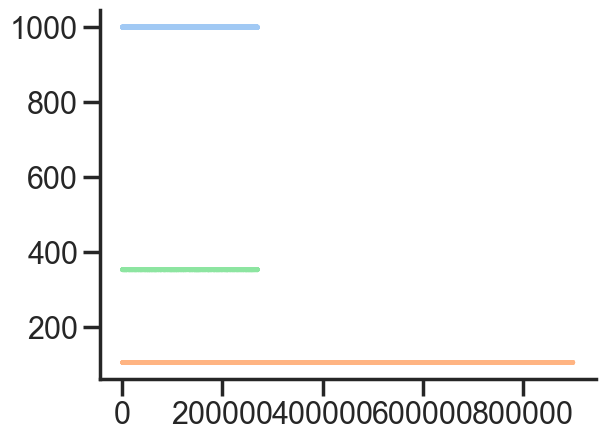

[4.4829000e+04 4.5181000e+04 4.5535000e+04 ... 9.5528711e+07 9.5529064e+07
 9.5529417e+07]
[9.4965000e+04 9.5071000e+04 9.5177000e+04 ... 9.5477206e+07 9.5477312e+07
 9.5477418e+07]
camera [142] [270309]
[270167]
270458 900444 270458
nt [1] [900440]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667, 9008.886066666666, 7202.6313666666665, 7224.9296, 7201.7563666666665, 8994.584966666667, 8998.803033333334, 9012.648933333334, 9002.0079, 9003.714433333333, 9003.420133333333, 9006.693066666667, 9004.2471] [9004.06363199 9004.06363199 9004.06363199 9004.06363199 9004.06363199
 9004.06363199 9004.06363199 9004.06363199 9004.06363199 9004.06363199
 9004.06363199 9004.06363199 9004.06363199 9004.06363199 9004.06363199
 9004.06363199 9004.06363199 9004.06363199 9004.06363199 9004.06363199
 9004.06

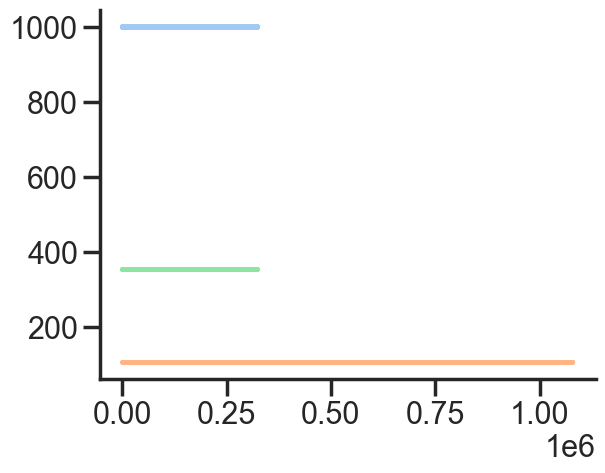

[4.08730000e+04 4.12260000e+04 4.15790000e+04 ... 1.14621216e+08
 1.14621569e+08 1.14621922e+08]
[8.44350000e+04 8.45410000e+04 8.46470000e+04 ... 1.14513145e+08
 1.14513251e+08 1.14513357e+08]
camera [124] [324240]
[324116]
324549 1080249 324549
nt [2] [1080246]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667, 9008.886066666666, 7202.6313666666665, 7224.9296, 7201.7563666666665, 8994.584966666667, 8998.803033333334, 9012.648933333334, 9002.0079, 9003.714433333333, 9003.420133333333, 9006.693066666667, 9004.2471, 10802.2624] [10802.05021118 10802.05021118 10802.05021118 10802.05021118
 10802.05021118 10802.05021118 10802.05021118 10802.05021118
 10802.05021118 10802.05021118 10802.05021118 10802.05021118
 10802.05021118 10802.05021118 10802.05021118 10802.05021118
 10802.05021118 10802.

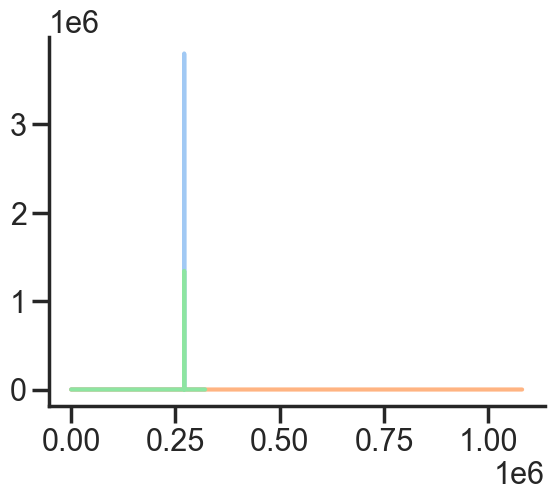

[4.08940000e+04 4.12470000e+04 4.16000000e+04 ... 1.14700529e+08
 1.14700882e+08 1.14701235e+08]
[7.57980000e+04 7.59040000e+04 7.60100000e+04 ... 1.14577087e+08
 1.14577193e+08 1.14577299e+08]
camera [99] [320618]
[320519]
320880 1080934 320971
nt [1] [1080929]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667, 9008.886066666666, 7202.6313666666665, 7224.9296, 7201.7563666666665, 8994.584966666667, 8998.803033333334, 9012.648933333334, 9002.0079, 9003.714433333333, 9003.420133333333, 9006.693066666667, 9004.2471, 10802.2624, 10809.1058] [10808.89166238 10808.89166238 10808.89166238 10808.89166238
 10808.89166238 10808.89166238 10808.89166238 10808.89166238
 10808.89166238 10808.89166238 10808.89166238 10808.89166238
 10808.89166238 10808.89166238 10808.89166238 10808.89166238
 10808.8916

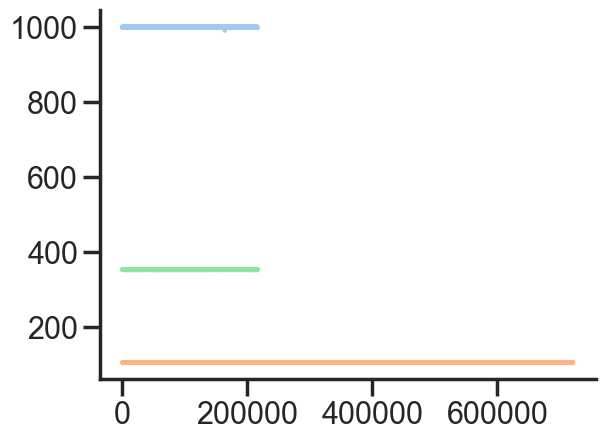

[4.2453000e+04 4.2806000e+04 4.3159000e+04 ... 7.6516847e+07 7.6517200e+07
 7.6517553e+07]
[   88607.    88713.    88819. ... 76459139. 76459245. 76459351.]
camera [131] [216450]
[216319]
216616 720967 216616
nt [1] [720965]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667, 9008.886066666666, 7202.6313666666665, 7224.9296, 7201.7563666666665, 8994.584966666667, 8998.803033333334, 9012.648933333334, 9002.0079, 9003.714433333333, 9003.420133333333, 9006.693066666667, 9004.2471, 10802.2624, 10809.1058, 7209.523133333333] [7209.37822079 7209.37822079 7209.37822079 7209.37822079 7209.37822079
 7209.37822079 7209.37822079 7209.37822079 7209.37822079 7209.37822079
 7209.37822079 7209.37822079 7209.37822079 7209.37822079 7209.37822079
 7209.37822079 7209.37822079 7209.37822079 7209.37822079 7209

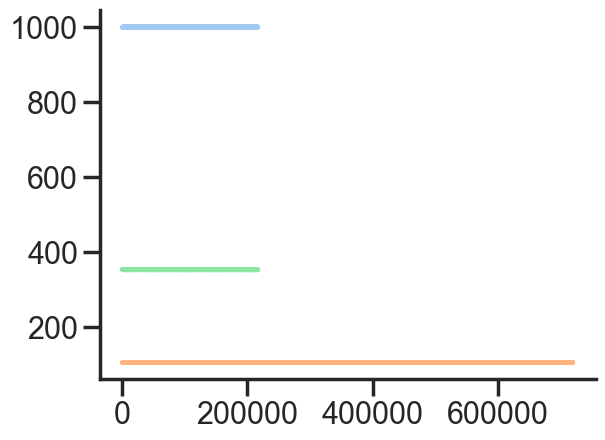

[7.2084000e+04 7.2437000e+04 7.2790000e+04 ... 7.6516877e+07 7.6517230e+07
 7.6517584e+07]
[  136729.   136835.   136941. ... 76434271. 76434376. 76434482.]
camera [184] [216297]
[216113]
216534 720278 216534
nt [4] [720274]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667, 9008.886066666666, 7202.6313666666665, 7224.9296, 7201.7563666666665, 8994.584966666667, 8998.803033333334, 9012.648933333334, 9002.0079, 9003.714433333333, 9003.420133333333, 9006.693066666667, 9004.2471, 10802.2624, 10809.1058, 7209.523133333333, 7202.5974] [7202.43793279 7202.43793279 7202.43793279 7202.43793279 7202.43793279
 7202.43793279 7202.43793279 7202.43793279 7202.43793279 7202.43793279
 7202.43793279 7202.43793279 7202.43793279 7202.43793279 7202.43793279
 7202.43793279 7202.43793279 7202.43793279 7202.43

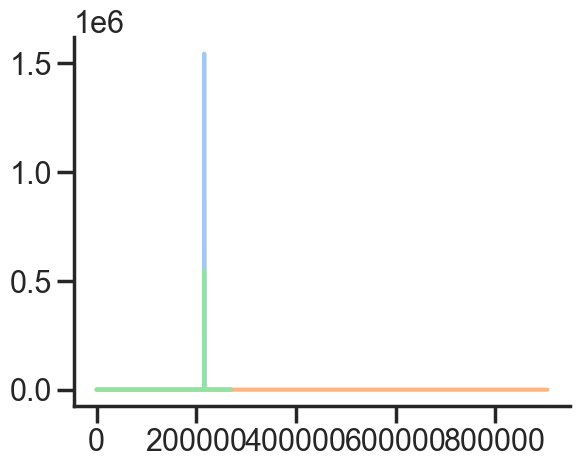

[4.3888000e+04 4.4242000e+04 4.4595000e+04 ... 9.5978040e+07 9.5978393e+07
 9.5978746e+07]
[9.2123000e+04 9.2229000e+04 9.2335000e+04 ... 9.5947431e+07 9.5947537e+07
 9.5947643e+07]
camera [137] [270108]
[269971]
270198 904910 270198
nt [2] [904905]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667, 9008.886066666666, 7202.6313666666665, 7224.9296, 7201.7563666666665, 8994.584966666667, 8998.803033333334, 9012.648933333334, 9002.0079, 9003.714433333333, 9003.420133333333, 9006.693066666667, 9004.2471, 10802.2624, 10809.1058, 7209.523133333333, 7202.5974, 9048.897233333333] [9048.70104959 9048.70104959 9048.70104959 9048.70104959 9048.70104959
 9048.70104959 9048.70104959 9048.70104959 9048.70104959 9048.70104959
 9048.70104959 9048.70104959 9048.70104959 9048.70104959 9048.70104959
 9048.

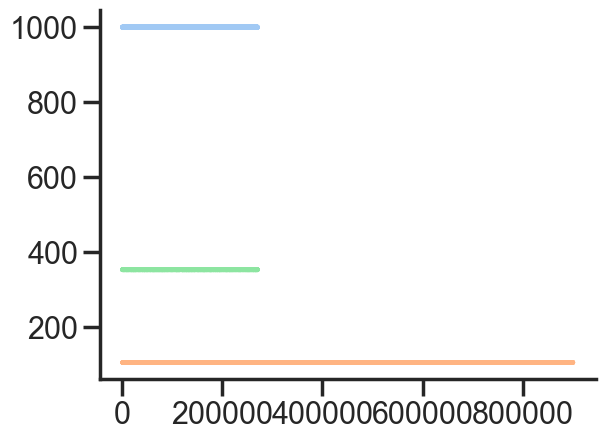

[6.5289000e+04 6.5642000e+04 6.5996000e+04 ... 9.5558764e+07 9.5559118e+07
 9.5559471e+07]
[  112179.   112285.   112391. ... 95509673. 95509779. 95509885.]
camera [133] [270349]
[270216]
270491 900588 270491
nt [1] [900585]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667, 9008.886066666666, 7202.6313666666665, 7224.9296, 7201.7563666666665, 8994.584966666667, 8998.803033333334, 9012.648933333334, 9002.0079, 9003.714433333333, 9003.420133333333, 9006.693066666667, 9004.2471, 10802.2624, 10809.1058, 7209.523133333333, 7202.5974, 9048.897233333333, 9005.6943] [9005.51342719 9005.51342719 9005.51342719 9005.51342719 9005.51342719
 9005.51342719 9005.51342719 9005.51342719 9005.51342719 9005.51342719
 9005.51342719 9005.51342719 9005.51342719 9005.51342719 9005.51342719
 9005.51342719 9005.

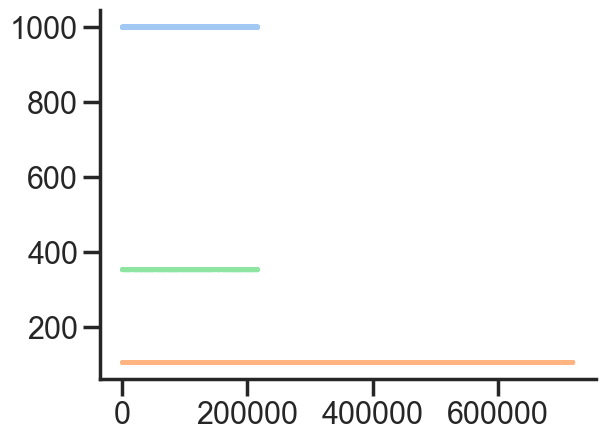

[5.6693000e+04 5.7046000e+04 5.7399000e+04 ... 7.6513149e+07 7.6513502e+07
 7.6513856e+07]
[  122848.   122954.   123060. ... 76415842. 76415948. 76416054.]
camera [188] [216292]
[216104]
216571 720235 216571
nt [2] [720230]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667, 9008.886066666666, 7202.6313666666665, 7224.9296, 7201.7563666666665, 8994.584966666667, 8998.803033333334, 9012.648933333334, 9002.0079, 9003.714433333333, 9003.420133333333, 9006.693066666667, 9004.2471, 10802.2624, 10809.1058, 7209.523133333333, 7202.5974, 9048.897233333333, 9005.6943, 7202.166766666666] [7202.01860799 7202.01860799 7202.01860799 7202.01860799 7202.01860799
 7202.01860799 7202.01860799 7202.01860799 7202.01860799 7202.01860799
 7202.01860799 7202.01860799 7202.01860799 7202.01860799 7202.01860799
 

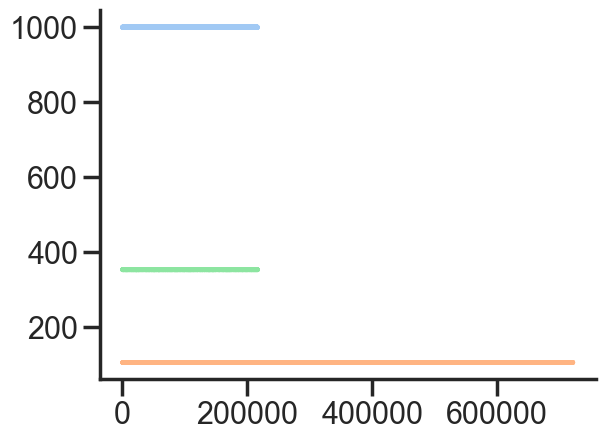

[6.8299000e+04 6.8652000e+04 6.9006000e+04 ... 7.6546304e+07 7.6546657e+07
 7.6547009e+07]
[  112235.   112341.   112446. ... 76516444. 76516550. 76516656.]
camera [125] [216545]
[216420]
216632 721285 216632
nt [2] [721283]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667, 9008.886066666666, 7202.6313666666665, 7224.9296, 7201.7563666666665, 8994.584966666667, 8998.803033333334, 9012.648933333334, 9002.0079, 9003.714433333333, 9003.420133333333, 9006.693066666667, 9004.2471, 10802.2624, 10809.1058, 7209.523133333333, 7202.5974, 9048.897233333333, 9005.6943, 7202.166766666666, 7212.695266666667] [7212.54741759 7212.54741759 7212.54741759 7212.54741759 7212.54741759
 7212.54741759 7212.54741759 7212.54741759 7212.54741759 7212.54741759
 7212.54741759 7212.54741759 7212.54741759 7212.54741

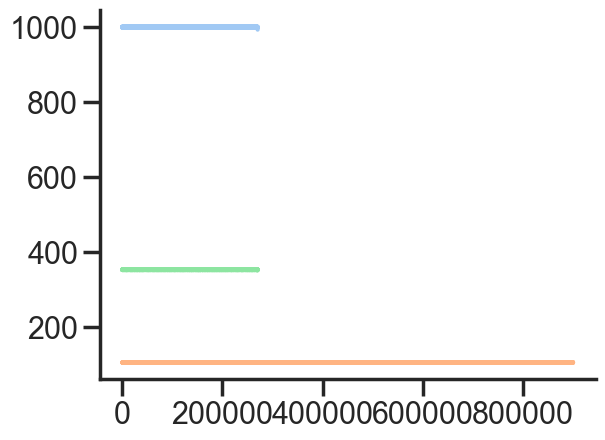

[7.3508000e+04 7.3861000e+04 7.4214000e+04 ... 9.5537947e+07 9.5538300e+07
 9.5538651e+07]
[  114094.   114200.   114306. ... 95481384. 95481490. 95481596.]
camera [115] [270249]
[270134]
270412 900303 270412
nt [1] [900300]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667, 9008.886066666666, 7202.6313666666665, 7224.9296, 7201.7563666666665, 8994.584966666667, 8998.803033333334, 9012.648933333334, 9002.0079, 9003.714433333333, 9003.420133333333, 9006.693066666667, 9004.2471, 10802.2624, 10809.1058, 7209.523133333333, 7202.5974, 9048.897233333333, 9005.6943, 7202.166766666666, 7212.695266666667, 9002.850033333334] [9002.66216959 9002.66216959 9002.66216959 9002.66216959 9002.66216959
 9002.66216959 9002.66216959 9002.66216959 9002.66216959 9002.66216959
 9002.66216959 9002.66216959 9002.

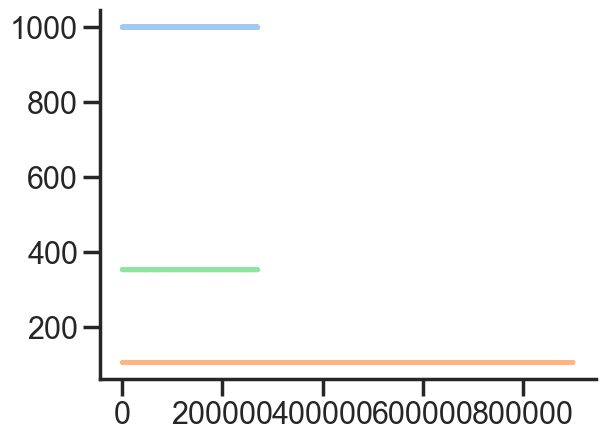

[6.6482000e+04 6.6835000e+04 6.7188000e+04 ... 9.5534455e+07 9.5534809e+07
 9.5535162e+07]
[  135862.   135968.   136074. ... 95491183. 95491289. 95491395.]
camera [197] [270293]
[270096]
270419 900190 270419
nt [2] [900185]
[7202.000933333334, 7423.529366666667, 7202.1657, 7200.771566666666, 7203.977266666667, 7192.625933333334, 7203.210766666667, 7208.707666666666, 7204.2908333333335, 7204.6833, 7204.269366666666, 9012.358733333333, 9003.281566666667, 9013.348366666667, 9008.886066666666, 7202.6313666666665, 7224.9296, 7201.7563666666665, 8994.584966666667, 8998.803033333334, 9012.648933333334, 9002.0079, 9003.714433333333, 9003.420133333333, 9006.693066666667, 9004.2471, 10802.2624, 10809.1058, 7209.523133333333, 7202.5974, 9048.897233333333, 9005.6943, 7202.166766666666, 7212.695266666667, 9002.850033333334, 9001.6876] [9001.50237119 9001.50237119 9001.50237119 9001.50237119 9001.50237119
 9001.50237119 9001.50237119 9001.50237119 9001.50237119 9001.50237119
 9001.50237119 9001.502

In [185]:
x_aln = []
y_aln = []
yaw_aln = []
speed_aln = []
duration = []
idx_camera = []
idx_camera_end = []
idx_nt = []
idx_nt_end = []

for ipath in range(0,len(x)):
    ipathsync = sync_path_matched[ipath]
    print('experiment',ipathsync)

    plt.plot(np.diff(ts_ephys_aln[ipath]))
    plt.plot(np.diff(nt_sync_aln[ipath]))
    plt.plot(np.diff(camera_sync_aln[ipath]))
    plt.show()

    print(camera_sync_aln[ipath])
    print(nt_sync_aln[ipath])
    
    _tmp_idx = []
    _tmp_idx = np.argwhere((camera_sync_aln[ipath] < nt_sync_aln[ipath][-1])==True)[-1]
    
    if ts_ephys_aln[ipath].size >= _tmp_idx:
        #Just to allign the camera with the sync, having the first frame of behavior and the last one
        idx_camera.append(np.argwhere((camera_sync_aln[ipath] > nt_sync_aln[ipath][0])==True)[0])
        idx_camera_end.append(np.argwhere((camera_sync_aln[ipath] < nt_sync_aln[ipath][-1])==True)[-1])
 
    if ts_ephys_aln[ipath].size < _tmp_idx:
        #Just to allign the camera with the sync, having the first frame of behavior and the last one
        idx_camera.append(np.argwhere((camera_sync_aln[ipath] > nt_sync_aln[ipath][0])==True)[0])
        idx_camera_end.append(np.array([ts_ephys_aln[ipath].size-1]).astype(int))
         
    
    print('camera',idx_camera[ipath],idx_camera_end[ipath])
    print(idx_camera_end[ipath]-idx_camera[ipath])


    print(ts_ephys_aln[ipath].size,nt_sync_aln[ipath].size,camera_sync_aln[ipath].size)


    duration.append(((ts_ephys_aln[ipath][idx_camera_end[ipath]] - ts_ephys_aln[ipath][idx_camera[ipath]]) /30000)[0])

    idx_nt.append(np.argwhere((nt_sync_aln[ipath] > camera_sync_aln[ipath][idx_camera[ipath]])==True)[0])
    idx_nt_end.append(np.argwhere((nt_sync_aln[ipath] < camera_sync_aln[ipath][idx_camera_end[ipath]])==True)[-1])
    print('nt',idx_nt[ipath],idx_nt_end[ipath])

    print(duration,(nt_sync_aln[ipath][idx_nt_end[ipath]] - nt_sync_aln[ipath][idx_nt[ipath]]) /ioFS)
    print('Deviation of',(duration[ipath] - (nt_sync_aln[ipath][idx_nt_end[ipath]] - nt_sync_aln[ipath][idx_nt[ipath]]) /ioFS[ipath]) * 1000, 'in miliseconds')
    print('Deviation at start',((camera_sync_aln[ipath][idx_camera[ipath]] - nt_sync_aln[ipath][idx_nt[ipath]])/ioFS[ipath]) * 1000,'in miliseconds')
    print('Deviation at end',((camera_sync_aln[ipath][idx_camera_end[ipath]] - nt_sync_aln[ipath][idx_nt_end[ipath]])/ioFS[ipath]) * 1000,'in miliseconds')

    
    
    ## align behavior

    x_aln.append(x[ipath][int(idx_nt[ipath][0]):int(idx_nt_end[ipath][0])])
    y_aln.append(y[ipath][int(idx_nt[ipath][0]):int(idx_nt_end[ipath][0])])
    yaw_aln.append(yaw[ipath][int(idx_nt[ipath][0]):int(idx_nt_end[ipath][0])])
    speed_aln.append(speed[ipath][int(idx_nt[ipath][0]):int(idx_nt_end[ipath][0])])

In [127]:
speed_path = r'C:\Users\fentonlab\Desktop\Gino\behaviour\\'
np.save(os.path.join(speed_path, "x_aln.npy"), x_aln)
np.save(os.path.join(speed_path, "y_aln.npy"), y_aln)
np.save(os.path.join(speed_path, "speed_aln.npy"), speed_aln)
np.save(os.path.join(speed_path, "yaw_aln.npy"), yaw_aln)

In [ ]:
## get lfp paths

In [186]:
#Example of how to append two files together
path_lfp = Path(r'Z:\NeuroPix\Ketamine\\')
dlc_path = path_lfp

files = dlc_path.glob('**/*.imec1.lf.bin')
HPC_lfp_path=[]

# files = os.listdir(dlc_path)

for i in files:
    
    if 'De_nosing' in str(i):
        break    
        
    HPC_lfp_path.append(i)
    print(i)


Z:\NeuroPix\Ketamine\2022-07-25-M015_SAL_mPFC_HPC_0.09_0.3_0.9ml_g0\2022-07-25-M015_SAL_mPFC_HPC_0.09_0.3_0.9ml_g0_imec1\2022-07-25-M015_SAL_mPFC_HPC_0.09_0.3_0.9ml_g0_t0.imec1.lf.bin
Z:\NeuroPix\Ketamine\2022-07-27-07-41-00_M015_SAL_PFC_HPC_0_0_0mpk\07-27-2022-M015_SAL_0.09_0.3_0.9_g0_imec1\07-27-2022-M015_SAL_0.09_0.3_0.9_g0_t0.imec1.lf.bin
Z:\NeuroPix\Ketamine\2022-07-28-13-19-00_M016_SAL_PFC_HPC_0_0_0mpk\07-28-2022_M016_SAL_0.09_0.3_0.9_g0_imec1\07-28-2022_M016_SAL_0.09_0.3_0.9_g0_t0.imec1.lf.bin
Z:\NeuroPix\Ketamine\2022-08-01_04-30-00_M015_RSK_mPFC_HPC_3_10_30mpk\2022-08-01_04-30-00_M015_RSK_mPFC_HPC_3_10_30mpk_g0_imec1\2022-08-01_04-30-00_M015_RSK_mPFC_HPC_3_10_30mpk_g0_t0.imec1.lf.bin
Z:\NeuroPix\Ketamine\2022-08-03_12-45-00_M015_RSK_mPFC_HPC_3_10_30mpk\2022-08-03_12-45-00_M015_RSK_mPFC_HPC_3_10_30mpk_g0_imec1\2022-08-03_12-45-00_M015_RSK_mPFC_HPC_3_10_30mpk_g0_t0.imec1.lf.bin
Z:\NeuroPix\Ketamine\2022-08-04_03-45-00_M016_RSK_mPFC_HPC_3_10_30mpk\2022-08-04_03-45-00_M016_RSK_mPF

In [27]:
sorted(HPC_lfp_path)

[WindowsPath('Z:/NeuroPix/Ketamine/2022-07-25-M015_SAL_mPFC_HPC_0.09_0.3_0.9ml_g0/2022-07-25-M015_SAL_mPFC_HPC_0.09_0.3_0.9ml_g0_imec1/2022-07-25-M015_SAL_mPFC_HPC_0.09_0.3_0.9ml_g0_t0.imec1.lf.bin'),
 WindowsPath('Z:/NeuroPix/Ketamine/2022-07-27-07-41-00_M015_SAL_PFC_HPC_0_0_0mpk/07-27-2022-M015_SAL_0.09_0.3_0.9_g0_imec1/07-27-2022-M015_SAL_0.09_0.3_0.9_g0_t0.imec1.lf.bin'),
 WindowsPath('Z:/NeuroPix/Ketamine/2022-07-28-13-19-00_M016_SAL_PFC_HPC_0_0_0mpk/07-28-2022_M016_SAL_0.09_0.3_0.9_g0_imec1/07-28-2022_M016_SAL_0.09_0.3_0.9_g0_t0.imec1.lf.bin'),
 WindowsPath('Z:/NeuroPix/Ketamine/2022-08-01_04-30-00_M015_RSK_mPFC_HPC_3_10_30mpk/2022-08-01_04-30-00_M015_RSK_mPFC_HPC_3_10_30mpk_g0_imec1/2022-08-01_04-30-00_M015_RSK_mPFC_HPC_3_10_30mpk_g0_t0.imec1.lf.bin'),
 WindowsPath('Z:/NeuroPix/Ketamine/2022-08-03_12-45-00_M015_RSK_mPFC_HPC_3_10_30mpk/2022-08-03_12-45-00_M015_RSK_mPFC_HPC_3_10_30mpk_g0_imec1/2022-08-03_12-45-00_M015_RSK_mPFC_HPC_3_10_30mpk_g0_t0.imec1.lf.bin'),
 WindowsPath('Z:/

In [187]:
## split path by \
root_lfp = []
for i in HPC_lfp_path:

    arr = []
    arr = [ x.strip() for x in str(i).split('\\') ]
    
    naming_convention = []
    naming_convention = arr[3]
    new = np.char.replace(naming_convention,'-','_')

    print(naming_convention)
    root_lfp.append(new)


2022-07-25-M015_SAL_mPFC_HPC_0.09_0.3_0.9ml_g0
2022-07-27-07-41-00_M015_SAL_PFC_HPC_0_0_0mpk
2022-07-28-13-19-00_M016_SAL_PFC_HPC_0_0_0mpk
2022-08-01_04-30-00_M015_RSK_mPFC_HPC_3_10_30mpk
2022-08-03_12-45-00_M015_RSK_mPFC_HPC_3_10_30mpk
2022-08-04_03-45-00_M016_RSK_mPFC_HPC_3_10_30mpk
2022-08-06-05-20-00_M016_RSK_mPFC_HPC_3_10_30mpk
2022-08-08-04-05-00_M017_SAL_mPFC_HPC_0_0_0mpk
2022-08-10-03-33-00_M017_RSK_mPFC_HPC_3_10_30mpk
2022-08-10-03-33-00_M017_RSK_mPFC_HPC_3_10_30mpk_2
2022-08-10-03-33-00_M017_RSK_mPFC_HPC_3_10_30mpk_all
2022-08-11-01-55-00_M018_SAL_mPFC_HPC_0_0_0mpk
2022-08-12-02-35-00_M017_RSK_mPFC_HPC_3_10_30mpk
2022-08-13-03-57-00_M018_RSK_mPFC_HPC_3_10_30mpk
2022-08-15-02-25-00_M018_RSK_mPFC_HPC_3_10_30mpk
2022-08-17-12-45-00_M019_1020_mPFC_HPC_1_3_10_30mpk
2022-08-17-12-45-00_M019_1020_mPFC_HPC_1_3_10_30mpk_2
2022-08-18-01-20-00_M020_1020_mPFC_HPC_1_3_10_30mpk
2022-08-19-04-25-00_M019_1020_mPFC_HPC_1_3_10_30mpk
2022-09-06-01-50-00-M021_1020_mPFC_HPC_1_3_10_30mpk
2022-09-0

In [188]:
## split path by \
HPC_lfp_path_matched = []
for i in ksort_HPC_path_matched:

    arr = []
    arr = [ x.strip() for x in str(i).split('\\') ]
    
    naming_convention = []
    naming_convention = arr[-1][:-9]
    new = []
    new = np.char.replace(naming_convention,'-','_')
    print(new)
    
    idx = root_lfp.index(new)
    
    print(HPC_lfp_path[idx])
    
    HPC_lfp_path_matched.append(HPC_lfp_path[idx])

2022_07_27_07_41_00_M015_SAL_PFC_HPC_0_0_0mpk
Z:\NeuroPix\Ketamine\2022-07-27-07-41-00_M015_SAL_PFC_HPC_0_0_0mpk\07-27-2022-M015_SAL_0.09_0.3_0.9_g0_imec1\07-27-2022-M015_SAL_0.09_0.3_0.9_g0_t0.imec1.lf.bin
2022_07_28_13_19_00_M016_SAL_PFC_HPC_0_0_0mpk
Z:\NeuroPix\Ketamine\2022-07-28-13-19-00_M016_SAL_PFC_HPC_0_0_0mpk\07-28-2022_M016_SAL_0.09_0.3_0.9_g0_imec1\07-28-2022_M016_SAL_0.09_0.3_0.9_g0_t0.imec1.lf.bin
2022_08_01_04_30_00_M015_RSK_mPFC_HPC_3_10_30mpk
Z:\NeuroPix\Ketamine\2022-08-01_04-30-00_M015_RSK_mPFC_HPC_3_10_30mpk\2022-08-01_04-30-00_M015_RSK_mPFC_HPC_3_10_30mpk_g0_imec1\2022-08-01_04-30-00_M015_RSK_mPFC_HPC_3_10_30mpk_g0_t0.imec1.lf.bin
2022_08_03_12_45_00_M015_RSK_mPFC_HPC_3_10_30mpk
Z:\NeuroPix\Ketamine\2022-08-03_12-45-00_M015_RSK_mPFC_HPC_3_10_30mpk\2022-08-03_12-45-00_M015_RSK_mPFC_HPC_3_10_30mpk_g0_imec1\2022-08-03_12-45-00_M015_RSK_mPFC_HPC_3_10_30mpk_g0_t0.imec1.lf.bin
2022_08_04_03_45_00_M016_RSK_mPFC_HPC_3_10_30mpk
Z:\NeuroPix\Ketamine\2022-08-04_03-45-00_M016_R

In [163]:
import os
import glob

#Example of how to append two files together
path_spk = Path(r'Z:\NeuroPix\spk_ketamine\HPC\\')
dlc_path = path_spk

out_path = Path(r'C:\Users\fentonlab\Desktop\Gino\HPC_channel_info\\')
spk_file_names = sorted(glob.glob(os.path.join(out_path, "spk_250Hz_*")))
spk_file_names

files = sorted(dlc_path.glob('**/*.file'))
HPC_spk_path=[]

# files = os.listdir(dlc_path)

for i in files:
    HPC_spk_path.append(i)
    print(i)
    
# with open('spk_file_names.pkl','wb') as file:
#     pickle.dump(spk_file_names,file)

Z:\NeuroPix\spk_ketamine\HPC\spk_250Hz_0.file
Z:\NeuroPix\spk_ketamine\HPC\spk_250Hz_1.file
Z:\NeuroPix\spk_ketamine\HPC\spk_250Hz_10.file
Z:\NeuroPix\spk_ketamine\HPC\spk_250Hz_11.file
Z:\NeuroPix\spk_ketamine\HPC\spk_250Hz_12.file
Z:\NeuroPix\spk_ketamine\HPC\spk_250Hz_13.file
Z:\NeuroPix\spk_ketamine\HPC\spk_250Hz_14.file
Z:\NeuroPix\spk_ketamine\HPC\spk_250Hz_15.file
Z:\NeuroPix\spk_ketamine\HPC\spk_250Hz_16.file
Z:\NeuroPix\spk_ketamine\HPC\spk_250Hz_17.file
Z:\NeuroPix\spk_ketamine\HPC\spk_250Hz_18.file
Z:\NeuroPix\spk_ketamine\HPC\spk_250Hz_19.file
Z:\NeuroPix\spk_ketamine\HPC\spk_250Hz_2.file
Z:\NeuroPix\spk_ketamine\HPC\spk_250Hz_20.file
Z:\NeuroPix\spk_ketamine\HPC\spk_250Hz_21.file
Z:\NeuroPix\spk_ketamine\HPC\spk_250Hz_22.file
Z:\NeuroPix\spk_ketamine\HPC\spk_250Hz_23.file
Z:\NeuroPix\spk_ketamine\HPC\spk_250Hz_24.file
Z:\NeuroPix\spk_ketamine\HPC\spk_250Hz_25.file
Z:\NeuroPix\spk_ketamine\HPC\spk_250Hz_26.file
Z:\NeuroPix\spk_ketamine\HPC\spk_250Hz_27.file
Z:\NeuroPix\spk_

In [190]:
beh_binned_all = []

for ipath in range(0,len(x)):
    print(ipath)
    
    behavior_con = []
    behavior_con = np.array([x_aln[ipath],y_aln[ipath],yaw_aln[ipath],speed_aln[ipath]])
    
    beh_binned_all.append(behavior_con)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35


In [129]:
beh_binned_all[0].shape

(4, 720214)

In [191]:
# whos

In [72]:
# load HPC file names and store them in rec spikes at 250 Hz
# path_spike = r'Z:\NeuroPix\spk_ketamine\HPC\spk_250Hz_0.file'
# with open(path_spike,'rb') as f:
#     spikes_binned_all_HPC = pickle.load(f)
    
## load behavior and upsample to 250Hz

In [260]:
#######

cluster_info_all_HPC = []
df_units_all_HPC = []

cids_to_keep_HPC_all = []

lfp_aln_idx = []

time_bin = 1/250 # in seconds

fs = 30000

spikes_binned_all_HPC = []

for ipath in range(0,1):
    
    ksort_path = ksort_HPC_path_matched[ipath]
    print('experiment',ksort_path)

    cluster_info_path = ksort_path.joinpath('cluster_info.tsv')
    cluster_group_path = ksort_path.joinpath('cluster_group.tsv')

    try:
        cluster_info = pd.read_csv(cluster_info_path, sep='\t')
    except:
        cluster_info = pd.read_csv(cluster_group_path, sep='\t')

    # for screening look only at good units 
    try:
        #cluster_info = cluster_info[cluster_info.group != 'noise']
        cluster_info = cluster_info[cluster_info.KSLabel == 'good']

    #    cluster_info = cluster_info[cluster_info.group == 'good']
    #    cluster_info = cluster_info[cluster_info.n_spikes > 100]
    #    cluster_info = cluster_info[(cluster_info.group == 'good') * (cluster_info.depth > 1200)]

    except:
        print('phy was not done')
        cluster_info = cluster_info[cluster_info.KSLabel == 'good']
        #cluster_info = cluster_info[cluster_info.KSLabel != 'noise']


    spike_times = np.load(ksort_path.joinpath('spike_times.npy'))
    spike_clusters = np.load(ksort_path.joinpath('spike_clusters.npy'))
    templates = np.load(ksort_path.joinpath('templates.npy'))
    spike_templates = np.load(ksort_path.joinpath('spike_templates.npy'))

    # cid_channels = dict(zip(cluster_info.id.values, cluster_info.ch.values))
    # cid_depth = dict(zip(cluster_info.id.values, cluster_info.depth.values))

    df_spikes = pd.DataFrame({'times':spike_times.flatten()/30000.0, 
               'unit_id':spike_clusters.flatten(), 
               'templates':spike_templates.flatten() })
    df_spikes.unit_id.unique().size
    
    
    
        # remove noise units
    try:
        kslabel_d = dict(zip(cluster_info.id, cluster_info.group))
    except:
        kslabel_d = dict(zip(cluster_info.cluster_id, cluster_info.KSLabel))

    df_spikes['kslabel'] = df_spikes.unit_id.map(kslabel_d)
    # remove noise units
    df_spikes = df_spikes.dropna()
#     df_spikes_all.append(df_spikes)
    cluster_info_all_HPC.append(cluster_info)
    print('allcells',df_spikes.unit_id.unique().size)
    
    cids_to_keep = []
    # cids_to_keep = cluster_info[cluster_info['ch'].isin(ch_HPC_list[ipath])].cluster_id.values    
#     print(cids_to_keep)
    # cids_to_keep_HPC_all.append(cids_to_keep)
    
    start_offset = []
    start_offset = int(ts_ephys_aln[ipath][idx_camera[ipath]])
    print(start_offset,start_offset/fs)
    
    
    ## start with neurotar light recording
    df_spk = []
    df_spk = df_spikes.copy()
    df_spk['spk'] = df_spikes['times']

    
    df_spk= df_spk[(df_spk['spk'] >= (ts_ephys_aln[ipath][idx_camera[ipath]]/fs)[0]) & (df_spk['spk'] <= (ts_ephys_aln[ipath][idx_camera_end[ipath]]/fs)[0])]
    df_spk.head()
    
    df_spk['spk'] = df_spk['times'] - (ts_ephys_aln[ipath][idx_camera[ipath]]/fs)[0]
    df_spk['spk'] 
    
    df_units = []
    df_units = bin_smooth_spk(df_spk, time_bin)  #0.01 is the time resolution to bin 0.01 s = 10ms
    
    _inp_l = []
    # _inp_l = df_units[df_units['cids'].isin(cids_to_keep)].pivot('cids', 'times', 'hz').values[:, :]
    _inp_l = df_units.pivot('cids', 'times', 'hz').values[:, :]

    spikes_binned_all_HPC.append(_inp_l)
    df_units_all_HPC.append(df_units)
    print('shape binned', _inp_l.shape)
    
    spk_tmp = []
    
    lfp_aln_idx.append([int(ts_ephys_aln[ipath][idx_camera[ipath]][0]/12),
                        int(ts_ephys_aln[ipath][idx_camera_end[ipath]][0]/12)])
    

experiment C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\electrophysiology\2022-07-27_07-41-00_M015_SAL_PFC_HPC_0_0_0mpk_HPCprobe
allcells 565
288932 9.631066666666667


MemoryError: Unable to allocate 7.58 GiB for an array with shape (1017281935,) and data type int64

In [196]:
print(spikes_binned_all_HPC[0].shape, beh_binned_all[0].shape)

(565, 720199) (4, 720214)


In [41]:
spikes_binned_all_HPC[0].shape

(565, 1800499)

In [42]:
spikes_binned_all_HPC[1].shape

(565,)

In [43]:
spikes_binned_all_HPC[2].shape

(565,)

In [ ]:
## load spk files
## load behavior at 100 Hz
## upsample behavior to 250Hz
## load lfp at 250 hz of that recording

In [ ]:
## spk_mask = true/false per cell when it spikes at 250 Hz
## phase_mask = hilbert transform of lfp to phase at 250Hz per frequency band (every 4-8 Hz)
## histogram1D with spk_mask as weights

In [206]:
def place_cell_properties(spk_data, beh_data, binsxy, fsrate, shuf_state):
    from scipy.ndimage import gaussian_filter

    occ, rate_maps_sm, rate_maps_temp, p_info, coh = [], [], [], [], []
    nRepeat = 1000  # number of shuffles

    # COMPUTING THE RATE MAPS
    occ = np.histogram2d(beh_data[0], beh_data[1], bins=binsxy)[0] / fsrate
    rate_maps_temp = [np.histogram2d(beh_data[0], beh_data[1], bins=binsxy, weights=s)[0]
                      / occ for s in spk_data]
    
#     ## radial version
#     Xcenter = beh_data[0] - (np.nanmax(beh_data[0]) + np.nanmin(beh_data[1])) / 2
#     Ycenter = beh_data[1] - (np.nanmax(beh_data[1]) + np.nanmin(beh_data[0])) / 2
    
#     alpha = np.arctan2(Ycenter, Xcenter)

#     L_occ = np.histogram(alpha, bins=binsxy)[0] /fsrate
#     LinMapsTemp_temp = [np.histogram(alpha, bins=binsxy, weights=s)[0] / L_occ
#          for s in spk_data]
    
    idx_nan = [np.isnan(p) for p in rate_maps_temp]

    rate_maps_sm = [gaussian_filter(np.nan_to_num(p), sigma=1) for p in rate_maps_temp] # not higher than 1.5
    
    for icell in range(0,len(rate_maps_sm)):
        
        rate_maps_sm[icell][idx_nan[icell]] = np.nan
        
#     ## plot firing rate maps
#     for icell in range(0,len(rate_maps_sm)):
#         fig = plt.figure(figsize=(2, 2))
#         ax = fig.add_subplot(1, 1, 1)
#         sns.heatmap(rate_maps_sm[icell], cmap='jet', ax=ax, cbar_kws={'label': 'Normalized rate'})
#         ax.set_xlabel('X position')
#         ax.set_ylabel('Y position')
#         fname = 'Cell' + str(icell)
#         ax.set_title(fname)
#         plt.show()    

    # analyze rate maps
    p_info = [place_info_content(occ, m) for m in rate_maps_temp]
    coh = [neighbor_sum(m) for m in rate_maps_temp]

    ## pinfo and coherence
    #     print('Place info', np.hstack(p_info))
    #     print('Coherence', np.hstack(coh))

    if shuf_state == True:
        # Randomizing
        sTrackedCopy = spk_data.copy()
        sTrackedTimePairs = list(zip(*sTrackedCopy))

        pInfoShuffled = []
        cohShuffled = []
        for iRand in range(nRepeat):
            np.random.shuffle(sTrackedTimePairs)
            sShuffled = list(zip(*sTrackedTimePairs))

            RateMapsShuffled = [np.histogram2d(beh_data[0], beh_data[1], bins=binsxy, weights=s)[0]
                                / occ for s in sShuffled]
            pInfoShuffled.append([place_info_content(occ, m) for m in RateMapsShuffled])

            cohShuffled.append([neighbor_sum(m) for m in RateMapsShuffled])

        pInfoTest = []
        for p, z in zip(p_info, zip(*pInfoShuffled)):
            Out = [p, (p - np.mean(z)) / np.std(z)]
            pInfoTest.append([Out, Out[0] > 1 and Out[1] > 1.96])

        cohTest = []
        for p, z in zip(coh, zip(*cohShuffled)):
            Out = [p, (p - np.mean(z)) / np.std(z)]
            testTmp = Out[0] > 0.5 and Out[1] > 1.96
            cohTest.append([Out, testTmp])

        # determine whether cells are place cells
        PC_test = [c[0][1] > 1.96 and p[0][1] > 1.96 for c, p in zip(cohTest, pInfoTest)]
        fr_test = [(np.sum(s)/(s.size/fsrate))<5 for s in spk_data]
        
    if shuf_state == False:
    
        PC_test = [c> 0.7 and p> 0.7 for c, p in zip(coh, p_info)]
        fr_test = [(np.sum(s)/(s.size/fsrate))<5 for s in spk_data]

    PC_fr_test = [p*q for p,q in zip(PC_test, fr_test)]    
    print('number of PCs', np.sum(PC_fr_test), 'of', len(PC_test))

    ## plot firing rate maps
    for icell in np.hstack(np.argwhere(np.hstack(PC_fr_test) == True)):
        print('place information', p_info[icell])
        print('coherence', coh[icell])
        print('firing rate', np.sum(spk_data[icell])/(spk_data[icell].size/fsrate))
        print('max PC rate', np.nanmax(np.nanmax(rate_maps_temp[icell])))

        fig = plt.figure(figsize=(2, 2))
        ax = fig.add_subplot(1, 1, 1)
#         sns.heatmap(rate_maps_temp_temp[icell], cmap='jet', ax=ax, cbar_kws={'label': 'Normalized rate'})
        sns.heatmap(rate_maps_sm[icell], cmap='jet', ax=ax, cbar_kws={'label': 'Normalized rate'})
        ax.set_xlabel('X position')
        ax.set_ylabel('Y position')
        fname = 'Cell' + str(icell)
        ax.set_title(fname)
        plt.show()

    return occ, rate_maps_temp, p_info, coh, PC_fr_test



experiment C:\Users\fentonlab\Desktop\Tony\Neurotar_HPC_ketamine\SPK\electrophysiology\2022-07-27_07-41-00_M015_SAL_PFC_HPC_0_0_0mpk_HPCprobe


C:\Users\fentonlab\AppData\Local\Temp\ipykernel_32568\1131466126.py:9: RuntimeWarning: invalid value encountered in divide
  rate_maps_temp = [np.histogram2d(beh_data[0], beh_data[1], bins=binsxy, weights=s)[0]


number of PCs 3 of 565
place information 1.7408431054307931
coherence 0.7314074681043673
firing rate 0.03888888888888889
max PC rate 22.22222222222222


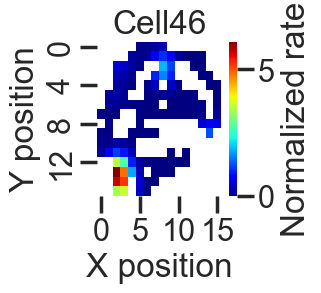

place information 1.2670985414223328
coherence 0.8039219338850863
firing rate 0.6572222222222223
max PC rate 1.891566265060241


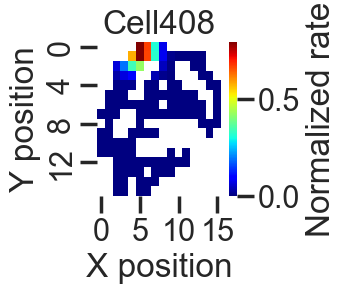

place information 1.3968501958434545
coherence 0.7031065715114565
firing rate 0.4583333333333333
max PC rate 44.44444444444444


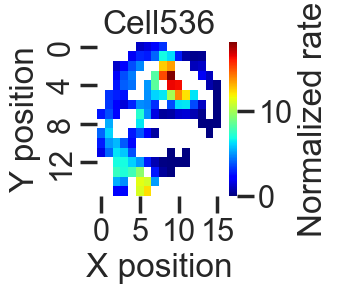

In [255]:
####
bins_position = 16
ls_tmp = []
fr_maps_all = []
PC_test_b_all = []

for irec in range(0,1): #len(x)):
    
#     if (drug_list[irec] == 'SAL') or (drug_list[irec] == 'PCP') or (drug_list[irec] == 'RSK'):
#     if (mouse_list[irec] == 'M15'):


    ksort_path = ksort_HPC_path_matched[irec]
    print('experiment',ksort_path)

    size_to = []
    size_to = np.min([spikes_binned_all_HPC[irec].shape[1],beh_binned_all[irec][0].size]) - 1



    # baseline
    occ_b, rate_maps_temp_b, p_info_b, coh_b, PC_test_b = [], [],[],[],[]   
    occ_b, rate_maps_temp_b, p_info_b, coh_b, PC_test_b = place_cell_properties(spikes_binned_all_HPC[irec][:,:30*60*100],
                                                                      np.array([beh_binned_all[irec][0][:30*60*100],
                                                                                beh_binned_all[irec][1][:30*60*100]]),
                                                                                bins_position,100,False)
    
    PC_test_b_all.append(PC_test_b)

In [257]:
rate_maps_temp_b[0]

array([[        nan,         nan,         nan,         nan,         nan,
         9.18367347,  9.73853732,  6.08860101, 18.12400636,         nan,
                nan,         nan,         nan,         nan,         nan,
                nan],
       [        nan,         nan,         nan,         nan,  5.7591623 ,
         8.72924715,  8.27710843,  8.27067669, 19.01114206,  3.33333333,
         4.76190476, 12.09677419, 37.5       ,  6.38297872,         nan,
                nan],
       [        nan,         nan, 13.51351351,  4.65707028,  7.76699029,
        10.        ,         nan,         nan,  0.        ,  0.        ,
                nan,         nan,  9.09090909,  5.71428571,         nan,
                nan],
       [        nan,         nan,  4.16666667, 13.04347826, 25.        ,
                nan,         nan,  0.        ,  4.54545455,  0.        ,
                nan,         nan,         nan, 10.27027027,  0.        ,
                nan],
       [        nan,         nan, 10

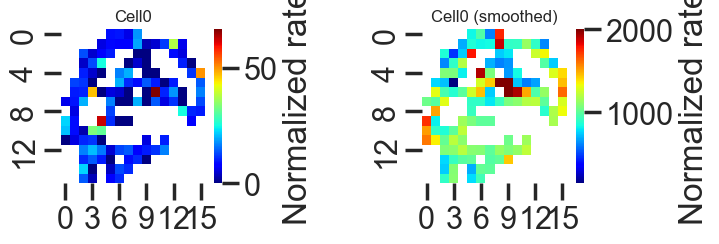

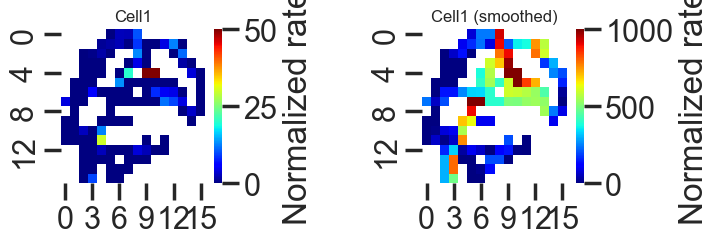

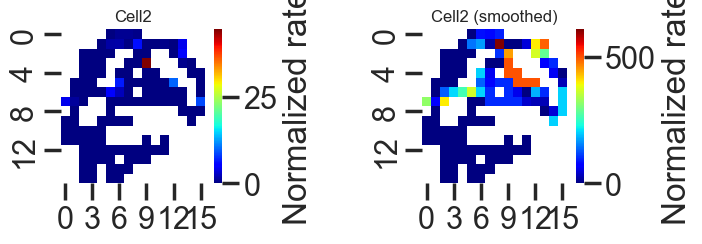

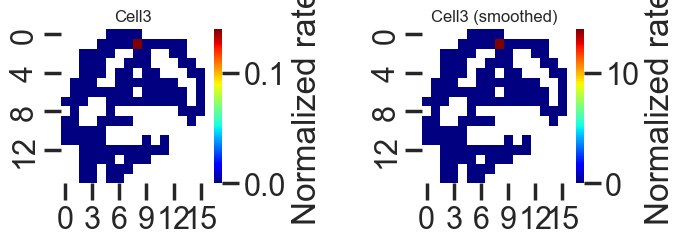

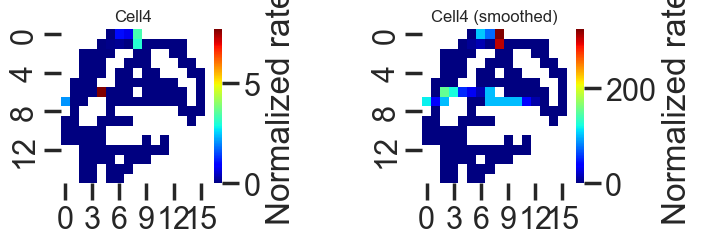

...

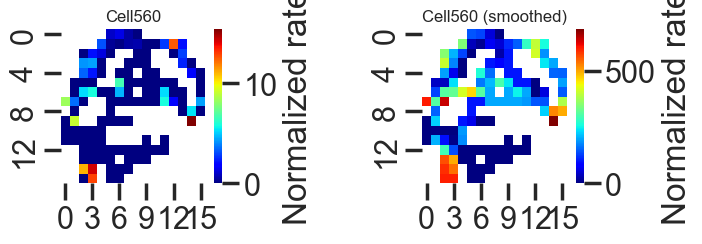

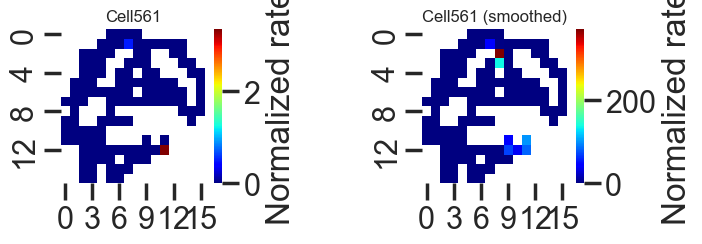

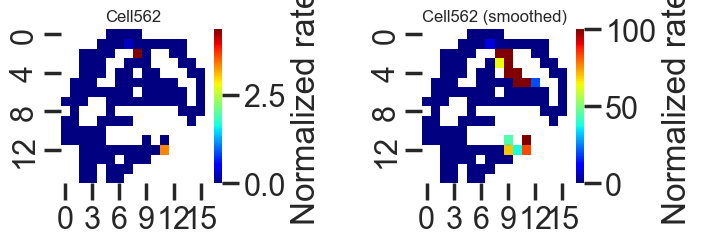

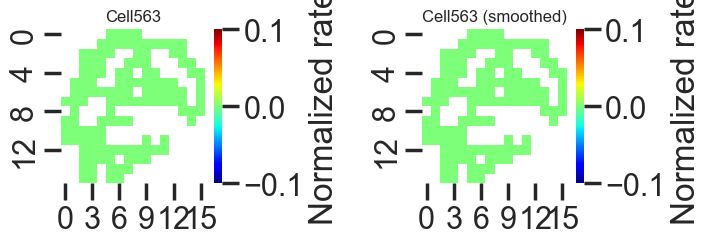

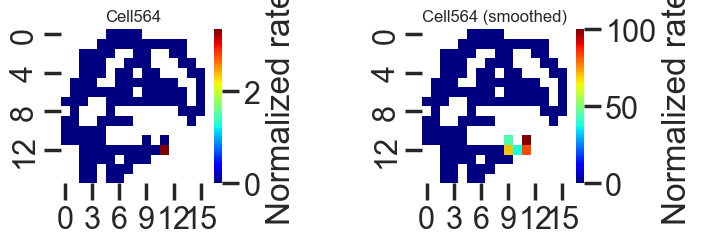

In [258]:
# ## plot firing rate maps
# for icell in range(0,len(rate_maps_temp_b)):
#     fig = plt.figure(figsize=(2, 2))
#     ax = fig.add_subplot(1, 1, 1)
#     sns.heatmap(rate_maps_temp_b[icell], cmap='jet', ax=ax, cbar_kws={'label': 'Normalized rate'})
#     ax.set_xlabel('X position')
#     ax.set_ylabel('Y position')
#     fname = 'Cell' + str(icell)
#     ax.set_title(fname)
#     plt.show()   
    

for icell in range(0,len(rate_maps_temp_b)):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(7, 2))
    
    # Plot for the first column
    sns.heatmap(rate_maps_temp_b[icell], cmap='jet', ax=axes[0], cbar_kws={'label': 'Normalized rate'})
    # axes[0].set_xlabel('X position')
    # axes[0].set_ylabel('Y position')
    fname = 'Cell' + str(icell)
    axes[0].set_title(fname,fontsize=12)

    # Plot for the second column (assuming a replication of the first for demonstration)
    sns.heatmap(rate_maps_temp_b_sm[icell], cmap='jet', ax=axes[1], cbar_kws={'label': 'Normalized rate'})
    # axes[1].set_xlabel('X position')
    # axes[1].set_ylabel('Y position')
    axes[1].set_title(fname + " (smoothed)",fontsize=12)
    
    plt.subplots_adjust(wspace=1)  # Adjust space between plots. You can modify the value as per your requirements.
    plt.show()


In [ ]:


###

def normalizer(a):
    out = []
    if (np.nanmax(a) - np.nanmin(a)) == 0:
        out = (a-np.nanmin(a))
    if (np.nanmax(a) - np.nanmin(a)) != 0:
        out = (a-np.nanmin(a))/(np.nanmax(a) - np.nanmin(a))
        
    return out

####

def fr_map_ang(spk_data, beh_data, binsxy, fsrate):
    from scipy.ndimage import gaussian_filter
    
    occ, rate_maps_temp= [], []
    
    Xcenter = beh_data[0] - (np.nanmax(beh_data[0]) + np.nanmin(beh_data[1])) / 2
    Ycenter = beh_data[1] - (np.nanmax(beh_data[1]) + np.nanmin(beh_data[0])) / 2
    
    alpha = np.arctan2(Ycenter, Xcenter)

    L_occ = np.histogram(alpha, bins=binsxy)[0] /fsrate
    LinMapsTemp_temp = [np.histogram(alpha, bins=binsxy, weights=s)[0] / L_occ
         for s in spk_data]
    
    LinMapsTemp = [normalizer(gaussian_filter(np.nan_to_num(p), sigma=1)) for p in LinMapsTemp_temp]
    

    return LinMapsTemp

####

In [ ]:


## spk is cell x time
## x and y positions in time
## win_legth which is the length of the path

def overdispersion(spk,xframes,yframes,iPosframes,win_length, thresh, frame, ipos_mode):

    Nbins = 16
    edgelength = 256/Nbins
    edges = np.arange(0,257,edgelength)
    sampRate = 7.5 # number of samples in a second

    occ_all = []
    rate_maps_all = []
    mean_fr_all = []
    mask_high_fr_all = []
    mask_deltaipos_all = []
    observed_rate_all = []
    expected_rate_all = []
    z_all = []
    
    binx_all = []
    biny_all = []
        
    if frame == "room":
        x,y,ipos = [],[],[]
        x = np.squeeze(xframes[0])
        y = np.squeeze(yframes[0])  
        ipos = iPosframes[0][0] 
        
    if frame == "arena":
        x,y,ipos = [],[],[]
        x = np.squeeze(xframes[1])
        y = np.squeeze(yframes[1])   
        ipos = iPosframes[0][1]      
    print('ipos_shape',ipos.shape)
    
    deltaipos = []
    deltaipos = iPosframes[0][0] - iPosframes[0][1] 
    
    # COMPUTING THE RATE MAPS
    for icell in range(0,spk.shape[0]):
        occ = []
        rate_maps_temp = []

        ## remove nans

        idx_nan = []
        idx_nan = np.invert(np.isnan(x) | np.isnan(y))
        
        mean_fr = []
        mean_fr = np.nansum(spk[icell])/(spk[icell].size/sampRate)
        

        # compute position map
        occ = np.histogram2d(x[idx_nan], y[idx_nan], bins=edges)[0]/sampRate
        # compute firing rate map normalized by occupancy
        rate_maps_temp = [np.histogram2d(x[idx_nan], y[idx_nan], bins=edges, weights=spk[icell][idx_nan])[0] / occ]

        # plot firing rate map per cell
        figure, axes = plt.subplots(figsize=(3,3))         
        sns.heatmap(rate_maps_temp[0])
        plt.show()
        
        
        ## not sure if that is real
        if mean_fr > 2:
#         if np.max(rate_maps_temp[0]) > 20 or np.max(rate_maps_temp[0]) < 10:
            print('high mean fr', mean_fr)
            print('PC peak rate',np.max(rate_maps_temp[0]))
            continue
        
        mean_fr_all.append(mean_fr)
        occ_all.append(occ)
        rate_maps_all.append(rate_maps_temp)
        
        ## compute overdispersion in windows of 5 seconds
        
        n_windows = []
        n_windows = spk[icell][idx_nan].size // win_length
        print('total number of epochs', n_windows)
        print('length of spiking in samples',spk[icell][idx_nan].size)
        spk_split = []
        
        if (spk[icell][idx_nan].size % win_length) > 0:
            spk_split = np.split(spk[icell][idx_nan][:-(spk[icell][idx_nan].size % win_length)],n_windows)
        if (spk[icell][idx_nan].size % win_length) == 0:
            spk_split = np.split(spk[icell][idx_nan],n_windows)
            
        print('spk.length',spk[icell][idx_nan].size)
        print('one path size',spk_split[0].shape)
        print('check')
        print(spk_split[0])
        print(spk[icell][idx_nan][0:30])

        if (spk[icell][idx_nan].size % win_length) > 0:

            x_split = []
            x_split = np.split(x[idx_nan][:-(spk[icell][idx_nan].size % win_length)],n_windows)
            y_split = []
            y_split = np.split(y[idx_nan][:-(spk[icell][idx_nan].size % win_length)],n_windows)   

            ## per time point compute expected rate, firing rate map sum over time

            bin_x = []
            bin_y = []       

            bin_x = [np.max([0,np.where(x_curr <= edges)[0][0]-1]) for x_curr in x[idx_nan][:-(spk[icell][idx_nan].size % win_length)]]
            bin_y = [np.max([0,np.where(y_curr <= edges)[0][0]-1]) for y_curr in y[idx_nan][:-(spk[icell][idx_nan].size % win_length)]]

        if (spk[icell][idx_nan].size % win_length) == 0:

            x_split = []
            x_split = np.split(x[idx_nan],n_windows)
            y_split = []
            y_split = np.split(y[idx_nan],n_windows)   

            ## per time point compute expected rate, firing rate map sum over time

            bin_x = []
            bin_y = []       

            bin_x = [np.max([0,np.where(x_curr <= edges)[0][0]-1]) for x_curr in x[idx_nan]]
            bin_y = [np.max([0,np.where(y_curr <= edges)[0][0]-1]) for y_curr in y[idx_nan]]
            
        ### ipos per cell
        if ipos_mode == "cell":
            if (spk[icell][idx_nan].size % win_length) > 0:
                deltaipos_split = np.split(deltaipos[icell][idx_nan][:-(spk[icell][idx_nan].size % win_length)],n_windows)
            if (spk[icell][idx_nan].size % win_length) == 0:
                deltaipos_split = np.split(deltaipos[icell][idx_nan],n_windows)        
 
        ### ipos as a population
        if ipos_mode == "population":
            if (spk[icell][idx_nan].size % win_length) > 0:
                deltaipos_split = np.split(np.nansum(deltaipos,axis=0)[idx_nan][:-(spk[icell][idx_nan].size % win_length)],n_windows)
            if (spk[icell][idx_nan].size % win_length) == 0:
                deltaipos_split = np.split(np.nansum(deltaipos,axis=0)[idx_nan],n_windows)        
        
        expected_timeseries = []
        expected_timeseries = [rate_maps_temp[0][bx,by]/sampRate  for bx,by in zip(bin_x,bin_y)]
#         expected_timeseries = [rate_maps_temp[0][bx,by]/sampRate  for bx,by in zip(bin_x,bin_y)]

        expected_timeseries_split = []        
        expected_timeseries_split = np.split(np.concatenate(expected_timeseries, axis=None),n_windows)   

        observed_rate, expected_rate = [], []

        # compute observed rate in the epoch
        observed_rate = [np.sum(p) for p in spk_split]

        #compute expected rate in the epoch from mean firing rate map
        expected_rate = [np.sum(p) for p in expected_timeseries_split]

        mask_highfr = []
        mask_highfr = [s > mean_fr*thresh for s in expected_rate]
        
        mask_ipos = []
        mask_ipos = [np.nanmean(s)>0 for s in deltaipos_split]
        
        mask_deltaipos_all.append(mask_ipos) ## positive means room frame

        z = []
        z = [(o-e)/np.sqrt(e) for o,e in zip(observed_rate,expected_rate)]

        mask_high_fr_all.append(mask_highfr)
        observed_rate_all.append(observed_rate)
        expected_rate_all.append(expected_rate)
        z_all.append(z)
        
        binx_all.append(bin_x)
        biny_all.append(bin_y)
        
        ## plot expected and observed rate
        
        fig = plt.figure(figsize=(8,8))
        ax = fig.add_subplot(1,1,1)
        win = np.arange(0,n_windows,1)
        ax.scatter(win, np.hstack(observed_rate)/(win_length/sampRate), color = 'black')
        ax.scatter(win, np.hstack(expected_rate)/(win_length/sampRate), color = 'red')
        ax.plot(mean_fr*np.ones(300), '--', color = 'gray')

        ax.set_ylabel('spikes per second')
        ax.set_xlabel('Path #')
        plt.show()
        
        ## plot z
        
        fig = plt.figure(figsize=(6,4))
        ax = fig.add_subplot(1,1,1)
        win = np.arange(0,n_windows,1)
        ax.scatter(win, z, color = 'black')
        ax.set_ylabel('Z')
        ax.set_xlabel('Path #')
        plt.show()        
        
    x, y, spk = [], [], []
        
    return occ_all, rate_maps_all, mean_fr_all, mask_high_fr_all,mask_deltaipos_all, observed_rate_all,expected_rate_all,z_all, binx_all, biny_all
